## Pseudonym error performance under multiple interference

In [183]:
import json
import pandas as pd
import math
import numpy as np
from scipy import signal
import h5py
import matplotlib.pyplot as plt
from matplotlib import rc
import datetime
import scipy.signal as signal
import pandas as pd
import seaborn as sns
import statistics as stats
from scipy.spatial.distance import hamming
import os

rc('xtick', labelsize=14) 
rc('ytick', labelsize=14)

In [184]:
def get_time_string(timestamp):
    '''
    Helper function to get data and time from timestamp
    INPUT: timestamp
    OUTPUT: data and time. Example: 01-04-2023, 19:50:27
    '''
    date_time = datetime.datetime.fromtimestamp(int(timestamp))
    return date_time.strftime("%m-%d-%Y, %H:%M:%S")

In [185]:
def JsonLoad(folder, json_file):
    '''
    Load parameters from the saved json file
    INPUT
    ----
        folder: path to the measurement folder. Example: "SHOUT/Results/Shout_meas_01-04-2023_18-50-26"
        json_file: the json file with all the specifications. Example: '/save_iq_w_tx_gold.json'
    OUTPUT
    ----
        samps_per_chip: samples per chip
        wotxrepeat: number of repeating IQ sample collection w/o transmission. Used as an input to 
        traverse_dataset() func
        rxrate: sampling rate at the receiver side
    '''
    #config_file = folder+'/'+json_file
    #config_file = ""+"/"+str(folder)+"/save_iq_w_tx_file.json"
    config_dict = json.load(open(json_file))[0]
    nsamps = config_dict['nsamps']
    rxrate = config_dict['rxrate']
    rxfreq = config_dict['rxfreq']
    wotxrepeat = config_dict['wotxrepeat']
    rxrepeat = config_dict['rxrepeat']
    txnodes = config_dict['txclients']
    rxnodes = config_dict['rxclients']

    return rxrepeat, rxrate, txnodes, rxnodes

In [186]:
def traverse_dataset(meas_folder):
    '''
    Load data from hdf5 format measurement file
    INPUT
    ----
        meas_folder: path to the measurement folder. Example: "SHOUT/Results/Shout_meas_01-04-2023_18-50-26"
    OUTPUT
    ----
        data: Collected IQ samples w/ transmission. It is indexed by the transmitter name
        noise: Collected IQ samples w/o transmission. It is indexed by the transmitter name
        txrxloc: transmitter and receiver names
    '''
    data = {}
    noise = {}
    txrxloc = {}

    dataset = h5py.File(meas_folder + '/measurements.hdf5', "r") #meas_folder
    #print("Dataset meta data:", list(dataset.attrs.items()))
    for cmd in dataset.keys():
        #print("Command:", cmd)
        if cmd == 'saveiq':
            cmd_time = list(dataset[cmd].keys())[0]
           # print("  Timestamp:", get_time_string(cmd_time))
            #print("  Command meta data:", list(dataset[cmd][cmd_time].attrs.items()))
            for rx_gain in dataset[cmd][cmd_time].keys():
               # print("   RX gain:", rx_gain)
                for rx in dataset[cmd][cmd_time][rx_gain].keys():
                    print("")
                    #print("     RX:", rx)
                    #print("       Measurement items:", list(dataset[cmd][cmd_time][rx_gain][rx].keys()))
        elif cmd == 'saveiq_w_tx':
            cmd_time = list(dataset[cmd].keys())[0]
            #print("  Timestamp:", get_time_string(cmd_time))
            #print("  Command meta data:", list(dataset[cmd][cmd_time].attrs.items()))
            for tx in dataset[cmd][cmd_time].keys():
                #print("   TX:", tx)
                
                if tx == 'wo_tx':
                    for rx_gain in dataset[cmd][cmd_time][tx].keys():
                        #print("       RX gain:", rx_gain)
                       # print(dataset[cmd][cmd_time][tx][rx_gain].keys())
                        for rx in dataset[cmd][cmd_time][tx][rx_gain].keys():
                            #print("         RX:", rx)
                            #print("           Measurement items:", list(dataset[cmd][cmd_time][tx][rx_gain][rx].keys()))
                            repeat = np.shape(dataset[cmd][cmd_time][tx][rx_gain][rx]['rxsamples'])[0]
                            #print("         repeat", repeat)

                            samplesNotx =  dataset[cmd][cmd_time][tx][rx_gain][rx]['rxsamples'][:repeat, :]
                            namelist = rx.split('-')
                            noise[namelist[1]] = samplesNotx
                else:
                    for tx_gain in dataset[cmd][cmd_time][tx].keys():
                        #print("     TX gain:", tx_gain)
                        for rx_gain in dataset[cmd][cmd_time][tx][tx_gain].keys():
                            #print("       RX gain:", rx_gain)
                            #print(dataset[cmd][cmd_time][tx][tx_gain][rx_gain].keys())
                            for rx in dataset[cmd][cmd_time][tx][tx_gain][rx_gain].keys():
                                repeat = np.shape(dataset[cmd][cmd_time][tx][tx_gain][rx_gain][rx]['rxsamples'])[0]
                                #print("         RX:", rx, "; samples shape", np.shape(dataset[cmd][cmd_time][tx][tx_gain][rx_gain][rx]['rxsamples']))
                                #print("         Measurement items:", list(dataset[cmd][cmd_time][tx][tx_gain][rx_gain][rx].keys()))
                                # print("         rxloc", (dataset[cmd][cmd_time][tx][tx_gain][rx_gain][rx]['rxloc'][0]))
                                # peak avg check
                                
                                txrxloc.setdefault(tx, []).extend([rx]*repeat)
                                rxsamples = dataset[cmd][cmd_time][tx][tx_gain][rx_gain][rx]['rxsamples'][:repeat, :]
                                data.setdefault(tx, []).append(np.array(rxsamples))

        else:                       
            print('Unsupported command: ', cmd)

    return data, noise, txrxloc

In [187]:
def plotOnePSDForEachLink(rx_data, txrxloc, samp_rate=2e6, repeats=10):
    for txname in rx_data:
        print(txname)
        for i in range(0, len(rx_data[txname]), repeats):
            plt.figure()
            plt.psd(rx_data[txname][i][1], Fs = samp_rate/1000)
            #plt.ylim(-110, -60)
            #plt.yticks(ticks=[-110, -100, -90, -80, -70, -60])
            plt.grid('on')
            plt.title('TX: {} RX: {}'.format(txname, txrxloc[txname][i]))
            plt.xlabel('Frequency (kHz)')
            plt.tight_layout()
            plt.show()

In [188]:
# PURPOSE: perform preamble synchronization
#          Uses the (complex-valued) preamble signal. The cross-correlation 
#          of the preamble signal and the received signal (at the time
#          when the preamble is received) should have highest magnitude
#          at the index delay where the preamble approximately starts.  
# INPUT:   rx0: received signal (with a frequency offset)
#          preambleSignal: complex, known, transmitted preamble signal 
# OUTPUT:  lagIndex: the index of rx0 where the preamble signal has highest 
#              cross-correlation
#
def crossCorrelationMax(rx0, preambleSignal):

    # Cross correlate with the preamble to find it in the noisy signal
    lags      = signal.correlation_lags(len(rx0), len(preambleSignal), mode='valid')
    xcorr_out = signal.correlate(rx0, preambleSignal, mode='valid')
    xcorr_mag = np.abs(xcorr_out)
    # Don't let it sync to the end of the packet.
    packetLenSamples = mess_length
    maxIndex = np.argmax(xcorr_mag[:len(xcorr_mag)-packetLenSamples])
    lagIndex = lags[maxIndex]
    
    print('The old lag ' + str(lagIndex))
    # Try to use the second lagIndex if the first one is not strong enough
    packetLenSamples = 0
    maxIndex2 = np.argmax(xcorr_mag[:len(xcorr_mag)-packetLenSamples])
    lagIndex2 = lags[maxIndex2]
    
#     print("xcorr_mag[maxIndex2]", xcorr_mag[maxIndex2])
    
    if abs(xcorr_mag[maxIndex2]) > abs(xcorr_mag[maxIndex]):
        lagIndex = lags[maxIndex2] - Frame_length
        print('The new lag ' + str(lagIndex))
    else:
        print('The old lag ' + str(lagIndex))
    #Plot the selected signal.
    plt.figure(1)
    fig, subfigs = plt.subplots(2,1)
    subfigs[0].plot(np.real(rx0), label='Real RX Signal')
    subfigs[0].plot(np.imag(rx0), label='Imag RX Signal')
    scale_factor = np.mean(np.abs(rx0))/np.mean(np.abs(preambleSignal))
    subfigs[0].plot(range(lagIndex, lagIndex + len(preambleSignal)), scale_factor*np.real(preambleSignal), label='Preamble')
    #subfigs[0].legend()
    subfigs[1].plot(lags, xcorr_mag, label='|X-Correlation|')
    plt.xlabel('Sample Index', fontsize=14)
    plt.show()
    #plt.tight_layout()

    return lagIndex

In [190]:
def text2bits(message):
    # Convert to characters of '1' and '0' in a vector.
    temp_message = []
    final_message = []
    for each in message:
        temp_message.append(format(ord(each), '07b'))
    for every in temp_message:
        for digit in every:
            final_message.append(int(digit))
    return final_message

In [191]:
# def Calculate_mean(x):
#     swap = np.zeros(49,)
#     for i in range(49):
#         swap[i] = sum(abs(x[i*N:(i+1)*N])**2)
#         print('Received power:',swap[i])
#     return np.median(swap)

In [192]:
import numpy as np
import math
def binvector2str(binvector):
    #binvector = binvector[0]
    length = len(binvector)
    eps = np.finfo('float').eps
    if abs(length/7 - round(length/7)) > eps:
        print('Length of bit stream must be a multiple of 7 to convert to a string.')
    # Each character requires 7 bits in standard ASCII
    num_characters = round(length/7)
    # Maximum value is first in the vector. Otherwise would use 0:1:length-1
    start = 6
    bin_values = []
    while start >= 0:
        bin_values.append(int(math.pow(2,start)))
        start = start - 1
    bin_values = np.array(bin_values)
    bin_values = np.transpose(bin_values)
    str_out = '' # Initialize character vector
    for i in range(num_characters):
        single_char = binvector[i*7:i*7+7]
        value = 0
        for counter in range(len(single_char)):
            value = value + (int(single_char[counter]) * int(bin_values[counter]))
        str_out += chr(int(value))
    return str_out

In [193]:
def get_samps_from_file(filename): 
    '''
    load samples from the binary file
    '''
    # File should be in GNURadio's format, i.e., interleaved I/Q samples as float32
    samples = np.fromfile(filename, dtype=np.float32)
    samps = (samples[::2] + 1j*samples[1::2]).astype((np.complex64)) # convert to IQIQIQ  
    return samps

In [194]:
# PURPOSE: create a modulated signal with the defined preamble
# INPUT: A (sqrt value for modulation), N, alpha, Lp (for srrc)
# OUTPUT: modulated preamble signal & srrc pulse
def createPreambleSignal(A, N, alpha, Lp):

    # We defined the preamble as this repeating bit signal:
    preamble     = np.tile([1, 1, 0, 0], 16)

    ###########################################
    ### Signal Generation
    ### INPUT: binary data
    ### OUTPUT: 4-ary data (0..3) values
    data = binary2mary(preamble, 4)

    ###########################################
    ### Modulation
    ### INPUT: data
    ### OUTPUT: modulated values, x
    inputVec   = [0, 1, 2, 3]
    outputVecI = [A, -A, A, -A]
    outputVecQ = [A, A, -A, -A]
    xI         = lut(data, inputVec, outputVecI)
    xQ         = lut(data, inputVec, outputVecQ)
    xI = xI.reshape((1,len(data)))
    xQ = xQ.reshape((1,len(data)))
    ###########################################
    ### Upsample
    ### INPUT: modulated values, x
    ### OUTPUT: modulated values at sampling rate, x_s
    x_s_I = oversample(xI, N)
    x_s_Q = oversample(xQ, N)

    ###########################################
    ### Pulse-shape filter
    ### INPUT: modulated values at sampling rate, x_s
    ### OUTPUT: baseband transmit signal s

    pulse = SRRC(alpha, N, Lp)
    pulse = np.array(pulse)
    pulse = np.reshape(pulse, pulse.size)
    x_s_I = np.reshape(x_s_I, x_s_I.size)
    x_s_Q = np.reshape(x_s_Q, x_s_Q.size)
    s_0_I = np.convolve(x_s_I, pulse, mode='full')
    s_0_Q = np.convolve(x_s_Q, pulse, mode='full')
#     plt.figure()
#     plt.plot(pulse,label='SRRC pulse shape')
#     plt.legend()
#     plt.show()
    
    preamb = s_0_I + 1j*s_0_Q
    #preamb = np.insert(s,0,np.zeros(1024))
    
#     plt.figure()
#     plt.plot(np.real(preamb),label='Real Signal')
#     plt.plot(np.imag(preamb),label='Imag Signal')
#     plt.grid('on')
#     plt.legend()
#     plt.show()
    return preamb, pulse

In [195]:
# PURPOSE: Convert binary data to M-ary by making groups of log2(M)
#          bits and converting each bit to one M-ary digit.
# INPUT: Binary digit vector, with length as a multiple of log2(M)
# OUTPUT: M-ary digit vector
def binary2mary(data, M):

    log2M   = round(np.log2(M))
    # integer number of bits per group
    if (len(data) % log2M) != 0:
        print('Input to binary2mary must be divisible by log2(m).')
    data.shape = (len(data)//log2M, log2M)
    binaryValuesArray = 2**np.arange(log2M)
    marydata = data.dot(binaryValuesArray)
    return marydata

In [196]:
# PURPOSE: convert input data stream to signal space values for
#          a particular modulation type (as specified by the inputVec
#          and outputVec).
# INPUT: data (groups of bits)
# OUTPUT: signal space values
def lut(data, inputVec, outputVec):
    if len(inputVec) != len(outputVec):
        print('Input and Output vectors must have identical length')
    # Initialize output
    output = np.zeros(data.shape)
    # For each possible data value
    eps = np.finfo('float').eps
    for i in range(len(inputVec)):
        # Find the indices where data is equal to that input value
        for k in range(len(data)):
            if abs(data[k]-inputVec[i]) < eps:
                # Set those indices in the output to be the appropriate output value.
                output[k] = outputVec[i]
    return output

In [197]:
# PURPOSE: insert 0's between samples to oversample at OS_Rate
# INPUT: x (data), OS_Rate (how frequently data occurs)
# OUTPUT: x_s (oversampled data)
def oversample(x, OS_Rate):
    # Initialize output
    length = len(x[0])
    x_s = np.zeros((1,length*OS_Rate))
    # Fill in one out of every OS_Rate samples with the input values
    count = 0
    h = 0
    for k in range(len(x_s[0])):
        count = count + 1
        if count == OS_Rate:
            x_s[0][k] = x[0][h]
            count = 0
            h = h + 1
    return x_s

In [198]:
# PURPOSE: create a square root raised cosine pulse shape
# INPUT: alpha, N, Lp
# OUTPUT: pulse wave array for srrc
def SRRC(alpha, N, Lp):
    # Add epsilon to the n values to avoid numerical problems
    n = np.arange(-N*Lp+ (1e-9), N*Lp+1)
    h = np.zeros(len(n))
    coeff = 1/np.sqrt(N)
    for i, each in enumerate(n):
        sine_term = np.sin(np.pi * each * (1-alpha) / N)
        cosine_term = np.cos(np.pi * each * (1+alpha) / N)
        cosine_coeff = 4 * alpha * each / N
        numerator = sine_term + (cosine_coeff * cosine_term)
        denom_coeff = np.pi * each / N
        denom_part = 1 - cosine_coeff**2
        denominator = denom_coeff * denom_part
        h[i] = coeff * numerator / denominator
    return h

# RX Below

In [199]:
A = np.sqrt(9/2)
N = 8
alpha = 0.5
Lp = 6
preambleSignal, pulse = createPreambleSignal(A, N, alpha, Lp)

#print("Preamble signal:",preambleSignal)

In [200]:

'''
Protocol parameters!!!
'''
'''
Protocol parameters!!!
'''
samples = 6000 # number of data samples per pseudonym bit
FFT = 64 # FFT size for extracting IQ sample in each subcarrier
CP = 16
OFDM_size = 80 # OFDM symbol with cyclic prefix
pseudonym_len = 4
pream_length = 352 + 1024
mess_length = samples*OFDM_size*pseudonym_len 
Frame_length = mess_length + pream_length
pattern_sample = samples//10

repeat = 10
samp_rate = 2e6

In [201]:
p_bit0_pattern = np.array([0,1,0,1,0,1,0,1,0,1])
p_bit1_pattern = np.array([1,0,1,0,1,0,1,0,1,0])

In [202]:
pseudonym_packet = np.zeros((pseudonym_len,1)) ## Transmitted pseudonym bit sequence
for i in range(pseudonym_len):
    if i%2 == 0:
        pseudonym_packet[i] = 1
pseudonym_packet

array([[1.],
       [0.],
       [1.],
       [0.]])

In [203]:
## FFT for data of window size=64
def DFT_data(x, n =64):
    return np.fft.fft(x,n)

In [204]:
''' Calculates FFT to recover the frequency domain signal in subcarriers and stores them in a matrix '''

def subchannel_data(x):
    sort_data = np.zeros((FFT, len(x)//OFDM_size), dtype = np.complex64)
    for i in range(len(x)//OFDM_size):
        y = x[i*OFDM_size:(i+1)*OFDM_size]
        
        sort_data[:,i] = np.fft.fftshift(np.fft.fft(y[CP:],64))  # Remove Cyclic Prefix and do FFT

    return sort_data

In [205]:
## calculate the power in each pseudonym bit and store it in matrix
def Cal_subch_power(x):
    sub_power = np.zeros((FFT,1))
    for i in range(FFT):
        sub_power[i] = sum(abs(x[i,:])**2)
    return sub_power

In [206]:
'''
calculates the distance between two arrays.
'''
def Distance(X,Y):
    count = 0
    for i in range(len(X)):
        if X[i]!= Y[i]:
            count +=1
    return count

In [207]:
def heuristic_mean(x):
    power = []
    for j in range(len(p_bit0_pattern)):
        power.append(np.mean(abs(x[j*OFDM_size*pattern_sample:(j+1)*OFDM_size*pattern_sample])**2))
    z_data = sorted(power, reverse = False)

    return stats.mean(z_data[2:9])

In [208]:
## Make p-bit decisions by comparing patterns on bit-0 and bit-1
## the patterns are 1010101010 for p-bit 1 and 0101010101 for p-bit 0
def Pseudonym_Detection1(x):
    p_bit = []
    for i in range(pseudonym_len):
        pbit_data = x[i*OFDM_size*samples:(i+1)*OFDM_size*samples] # slices samples into one p-bit data

        r_bit_pattern2 = []
        power2 = []
        for j in range(len(p_bit0_pattern)):
            chip_data = pbit_data[j*OFDM_size*pattern_sample:(j+1)*OFDM_size*pattern_sample]
            FFT_matrix = subchannel_data(chip_data)
            subchannel_power = Cal_subch_power(FFT_matrix)
            power2.append(subchannel_power[48,0])
            
#             index_max = np.argmax(subchannel_power)
#             print("Index of max:",index_max)

        for k in range(len(p_bit0_pattern)):
            if power2[k] > np.mean(sorted(power2, reverse = False)[2:9]):
                r_bit_pattern2.append(1)
            else:
                r_bit_pattern2.append(0)
                
                
        plt.plot(power2)
        plt.show()
                
       
        print("detected pattern:",r_bit_pattern2)

        d21 = Distance(p_bit1_pattern,r_bit_pattern2)
        d20 = Distance(p_bit0_pattern,r_bit_pattern2)

        
        if (d21) < (d20):
            p_bit.append(1)
        else:
            p_bit.append(0)  
    return np.array(p_bit)

In [209]:
## Make p-bit decisions by comparing patterns on bit-0 and bit-1
## the patterns are 1010101010 for p-bit 1 and 0101010101 for p-bit 0
def Pseudonym_Detection2(x):
    p_bit = []
    for i in range(pseudonym_len):
        pbit_data = x[i*OFDM_size*samples:(i+1)*OFDM_size*samples] # slices samples into one p-bit data
        
        r_bit_pattern1 = []
        r_bit_pattern2 = []
        power2 = []
        for j in range(len(p_bit0_pattern)):
            chip_data = pbit_data[j*OFDM_size*pattern_sample:(j+1)*OFDM_size*pattern_sample]
            FFT_matrix = subchannel_data(chip_data)
            subchannel_power = Cal_subch_power(FFT_matrix)
            power1.append(subchannel_power[42,0])
            power2.append(subchannel_power[48,0])
            
#             index_max = np.argmax(subchannel_power)
#             print("Index of max:",index_max)
    
        for k in range(len(p_bit0_pattern)):
            if power1[k] > np.mean(sorted(power1, reverse = False)[2:9]):
                r_bit_pattern1.append(1)
            else:
                r_bit_pattern1.append(0)
        for k in range(len(p_bit0_pattern)):
            if power2[k] > np.mean(sorted(power2, reverse = False)[2:9]):
                r_bit_pattern2.append(1)
            else:
                r_bit_pattern2.append(0)
                
#        print("detected pattern:",r_bit_pattern2)
#         plt.plot(power2)
#         plt.show()
        d21 = Distance(p_bit1_pattern,r_bit_pattern2)
        d20 = Distance(p_bit0_pattern,r_bit_pattern2)
        d11 = Distance(p_bit1_pattern,r_bit_pattern1)
        d10 = Distance(p_bit0_pattern,r_bit_pattern1)
        
        if (d21+d10) < (d20+d11):
            p_bit.append(1)
        else:
            p_bit.append(0)  
    return np.array(p_bit)

In [210]:
## Make p-bit decisions by comparing patterns on bit-0 and bit-1
## the patterns are 1010101010 for p-bit 1 and 0101010101 for p-bit 0
def Pseudonym_Detection3(x):
    p_bit = []
    for i in range(pseudonym_len):
        pbit_data = x[i*OFDM_size*samples:(i+1)*OFDM_size*samples] # slices samples into one p-bit data
        
        power = []
        r_bit_pattern = []
      
        for j in range(len(p_bit0_pattern)):
            chip_data = pbit_data[j*OFDM_size*pattern_sample:(j+1)*OFDM_size*pattern_sample]
            FFT_matrix = subchannel_data(chip_data)
            subchannel_power = Cal_subch_power(FFT_matrix)
            power.append(subchannel_power[48,0])
            
#             index_max = np.argmax(subchannel_power)
#             print("Index of max:",index_max)
                
        plt.plot(power)
        plt.show()

        for k in range(len(p_bit0_pattern)-1):
            
            if power[k] > power[k+1]:
                r_bit_pattern.append(1)
            else:
                r_bit_pattern.append(0)
                
        if power[8] < power[9]:
            r_bit_pattern.append(1)
        else:
            r_bit_pattern.append(0)

        
        print("detected pattern:",r_bit_pattern)     

        d21 = Distance(p_bit1_pattern,r_bit_pattern)
        d20 = Distance(p_bit0_pattern,r_bit_pattern)

        if (d21) < (d20):
            p_bit.append(1)
        else:
            p_bit.append(0)  
    return np.array(p_bit)

In [211]:
## Make p-bit decisions by comparing patterns on bit-0 and bit-1
## the patterns are 1010101010 for p-bit 1 and 0101010101 for p-bit 0
def Matched_Filter_Pseudonym_Detection_Algorithm(x):
    matching_filter =np.array([1,-1,1,-1,1,-1,1,-1,1,-1])
    p_bit = []
    for i in range(pseudonym_len):
        pbit_data = x[i*OFDM_size*samples:(i+1)*OFDM_size*samples] # slices samples into one p-bit data
        
        power = []
        r_bit_pattern = []
      
        for j in range(len(p_bit0_pattern)):
            chip_data = pbit_data[j*OFDM_size*pattern_sample:(j+1)*OFDM_size*pattern_sample]
            FFT_matrix = subchannel_data(chip_data)
            subchannel_power = Cal_subch_power(FFT_matrix)
            power.append(subchannel_power[48,0])
       
        plt.plot(power)
        plt.show()
        
        threshold = 0.0
        quantization_level = np.array([1,-1])
        for k in range(len(p_bit0_pattern)-1):
            if power[k] > power[k+1]:
                power[k] = quantization_level[0]
            else:
                power[k] = quantization_level[1]
        if power[8] < power[9]:
            power[9] = quantization_level[0]
        else:
            power[9] = quantization_level[1]
        pseudonym_power = np.dot(power,matching_filter)        

        if pseudonym_power > threshold:
            p_bit.append(1)
        else:
            p_bit.append(0)  
    return np.array(p_bit)

In [212]:
''' Calculates the pseudonym bit error by comparing the detected pseudonym bits 
to the transmitted pseudonym bits.
'''
def Pseudonym_BER(x):
    preds = Pseudonym_Detection3(x)
    p_bit_error = Distance(preds,pseudonym_packet)
   
    return p_bit_error

In [213]:
def Extract_Folders(x):
    r = []
    for root, dirs, files in os.walk(x):
        r.append(dirs)
    return r

In [214]:
'''
Checks if pseudonyms are decoded correctly in each repeat of shout transmission.
One experiment has 10 repeats.
'''
def Average_Pseudonym_Error(x):
    # Load parameters from the JSON file which describe what was measured
 
    #folder = x
    jsonfile = "save_iq_w_tx_file.json"
    rxrepeat, samp_rate, txlocs, rxlocs = JsonLoad(x, jsonfile)
    # Load data from the HDF5 file, save IQ sample arrays
    rx_data, rx_noise, txrxloc = traverse_dataset(x)
    samp_rate = 2e6

    txloc = 'cbrssdr1-ustar-comp'
    rxloc = 'cbrssdr1-browning-comp'
    
    #Calculate SNR
    Noise = rx_noise['browning'][0]
    noise_power = sum(abs(Noise)**2)/len(Noise)
#     print("Noise Power:",noise_power)
    rx_data[txloc] = np.vstack(rx_data[txloc])
    rxloc_arr = np.array(txrxloc[txloc])       

    # initialize error
    pseudonym_BER = 0
    P_s = 0
    for i in range(repeat):
        repNum = i
        rx_data[txloc] = np.vstack(rx_data[txloc])
        rxloc_arr = np.array(txrxloc[txloc])
        rx0 = rx_data[txloc][rxloc_arr==rxloc][repNum]
    

        # synchronize pseudonym using preamble signal
        lagIndex = crossCorrelationMax(rx0, preambleSignal)
       
        Rx_signal = rx0[lagIndex:mess_length+lagIndex]
        
        repeat_BER = Distance(Matched_Filter_Pseudonym_Detection_Algorithm(Rx_signal),pseudonym_packet)
        if  repeat_BER !=0:
            print("Errors Found:",repeat_BER)
        print("Repeat Number:", i, "Number of Errors:",repeat_BER)
        pseudonym_BER += repeat_BER
 
        P_s += sum(abs(Rx_signal)**2)/len(Rx_signal)
    
    signal_power = P_s/repeat
    
    return pseudonym_BER, signal_power, noise_power

In [215]:
'''
Computes the average pseudonym error in the experiment.
Experiment data is stored in folders that contain 10 repeats each.
'''
def Prob_Pseudonym_Error(x):
    folders = Extract_Folders(x)[0]
    num_folders = len(folders)
    print('Number of folders:',num_folders)
    pseudonym_BER = 0
    signal,noise = 0,0
    noise_power = []
    Exp_power = []
    for i in range(num_folders):
        print(folders[i])
        error,s,n= Average_Pseudonym_Error(folders[i])
        
        pseudonym_BER += error
        signal += s
        noise += n
        noise_power.append(n)

    Eb_No = 10*(np.log10(0.5*(signal-noise)/noise))
    
    print("total number of pseudonym bit errors:", pseudonym_BER)
    return pseudonym_BER/(repeat*num_folders*pseudonym_len), Eb_No

Number of folders: 10
Shout_meas_02-28-2024_09-16-09
The old lag 47138
The old lag 47138


<Figure size 432x288 with 0 Axes>

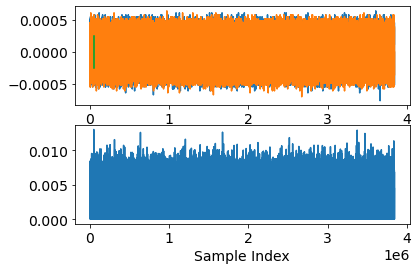

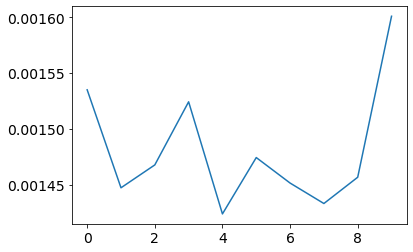

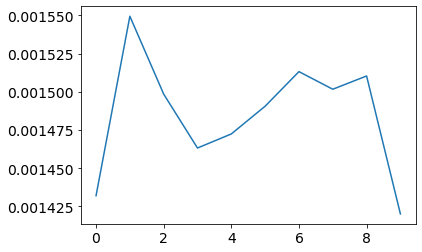

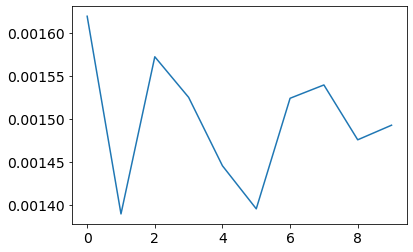

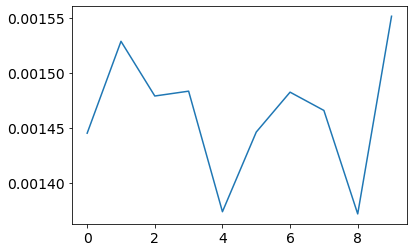

Errors Found: 3
Repeat Number: 0 Number of Errors: 3
The old lag 450443
The new lag 1170960


<Figure size 432x288 with 0 Axes>

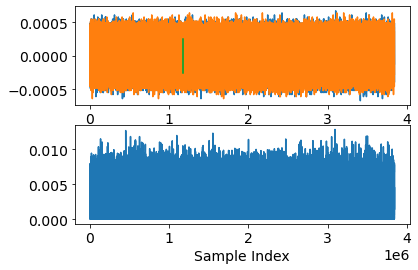

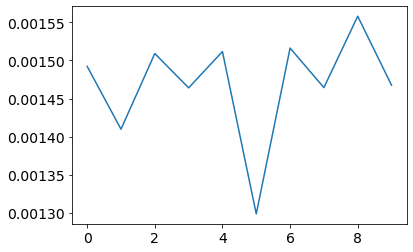

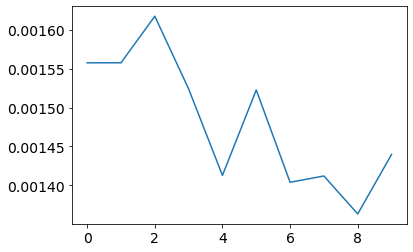

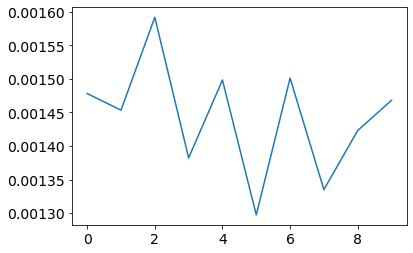

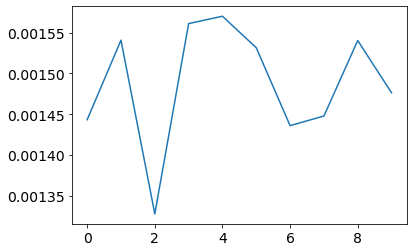

Repeat Number: 1 Number of Errors: 0
The old lag 1771543
The new lag 1083305


<Figure size 432x288 with 0 Axes>

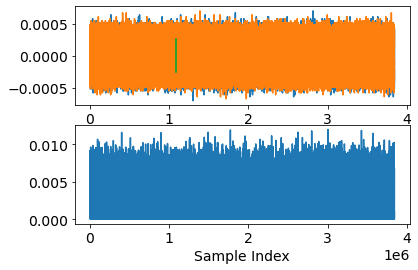

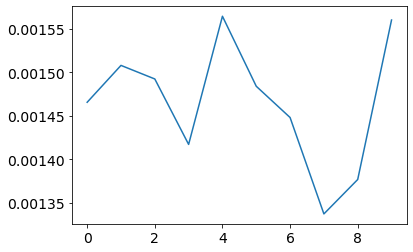

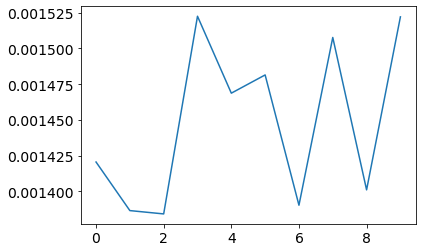

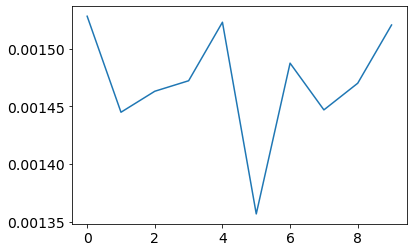

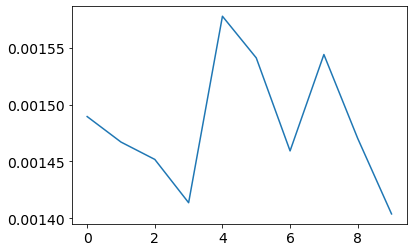

Errors Found: 2
Repeat Number: 2 Number of Errors: 2
The old lag 768040
The new lag 1226987


<Figure size 432x288 with 0 Axes>

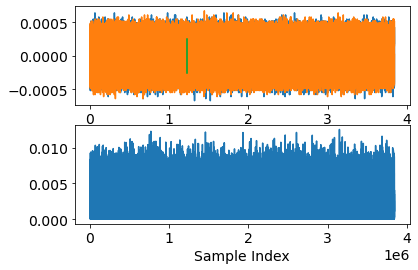

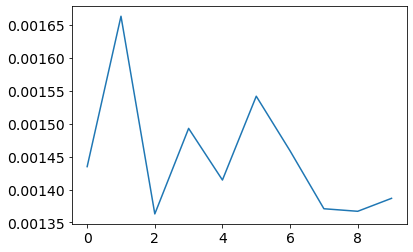

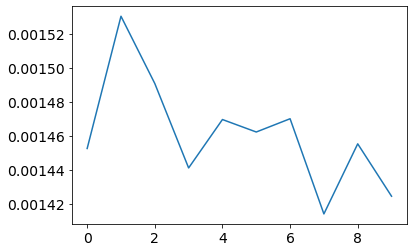

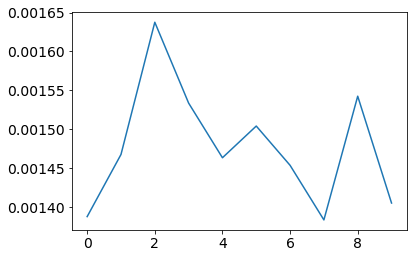

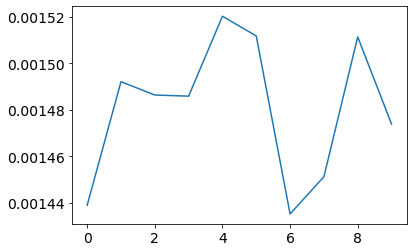

Errors Found: 3
Repeat Number: 3 Number of Errors: 3
The old lag 566529
The new lag 167400


<Figure size 432x288 with 0 Axes>

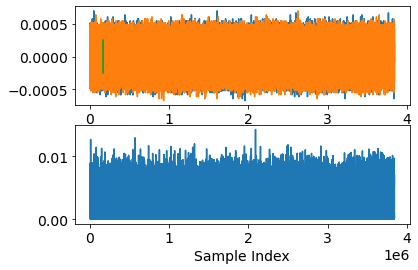

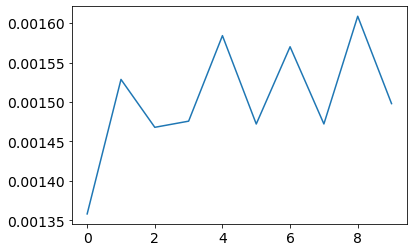

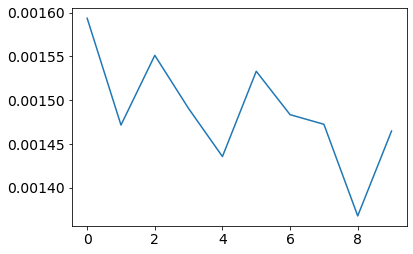

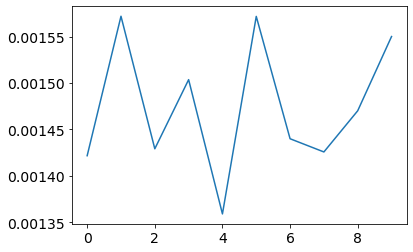

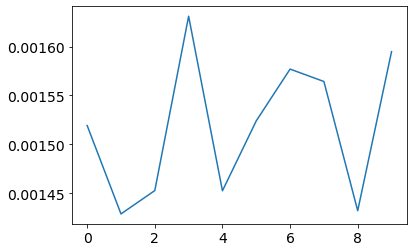

Errors Found: 1
Repeat Number: 4 Number of Errors: 1
The old lag 365065
The old lag 365065


<Figure size 432x288 with 0 Axes>

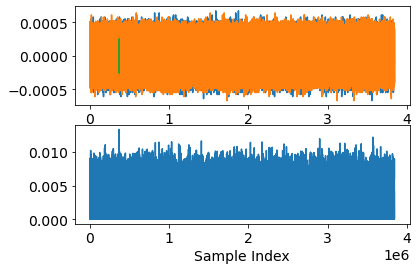

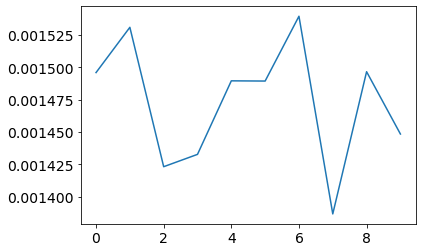

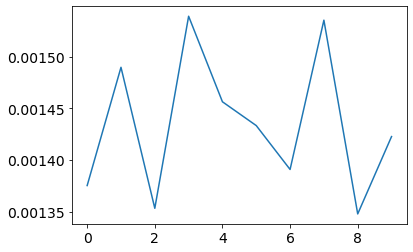

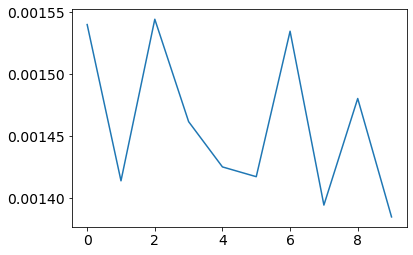

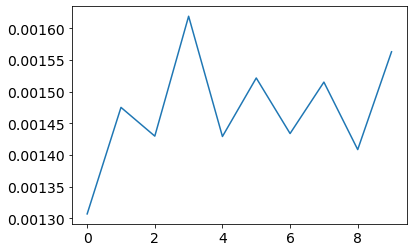

Repeat Number: 5 Number of Errors: 0
The old lag 224085
The new lag 242177


<Figure size 432x288 with 0 Axes>

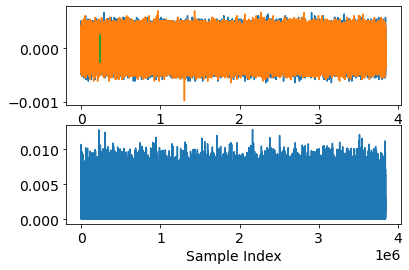

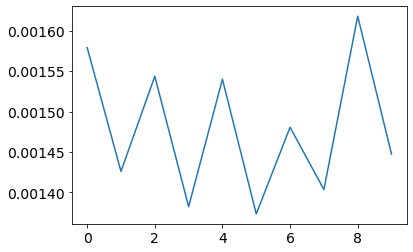

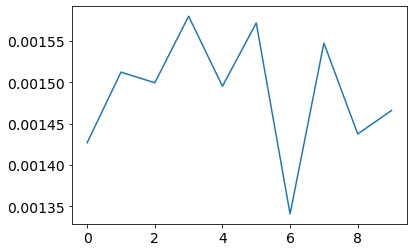

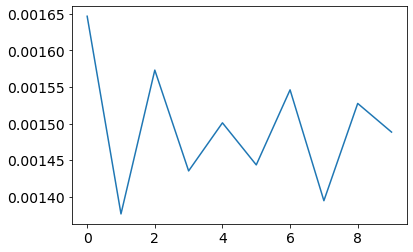

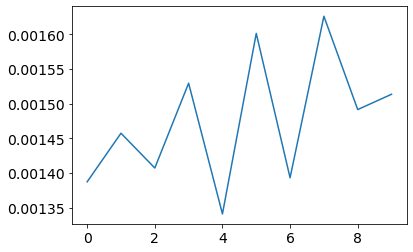

Repeat Number: 6 Number of Errors: 0
The old lag 1797874
The new lag 936046


<Figure size 432x288 with 0 Axes>

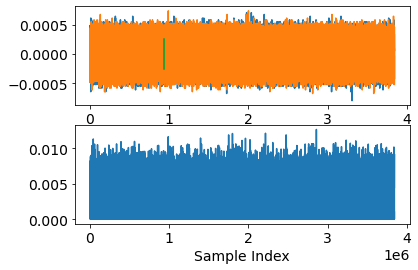

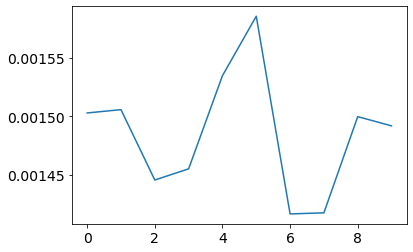

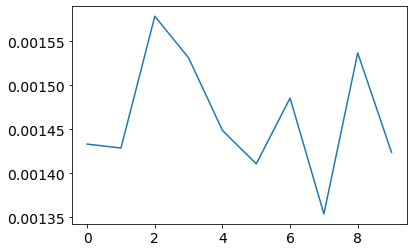

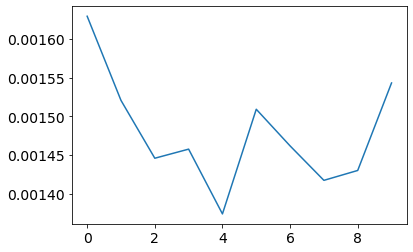

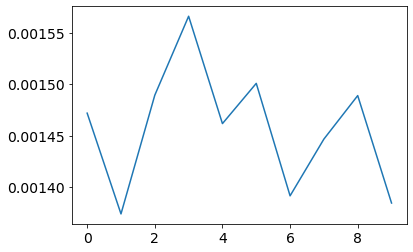

Errors Found: 3
Repeat Number: 7 Number of Errors: 3
The old lag 1134129
The old lag 1134129


<Figure size 432x288 with 0 Axes>

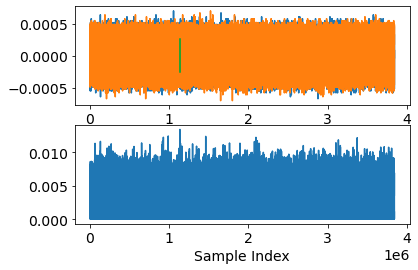

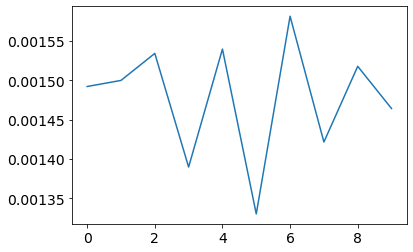

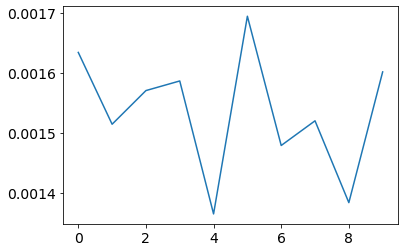

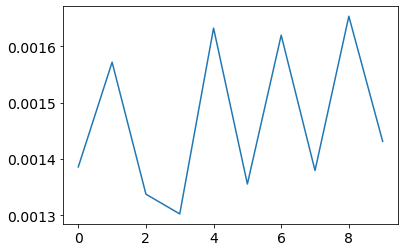

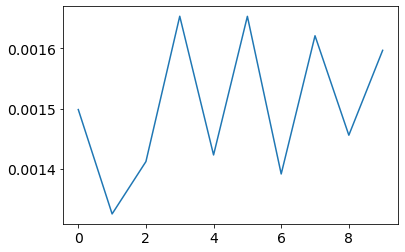

Repeat Number: 8 Number of Errors: 0
The old lag 23424
The old lag 23424


<Figure size 432x288 with 0 Axes>

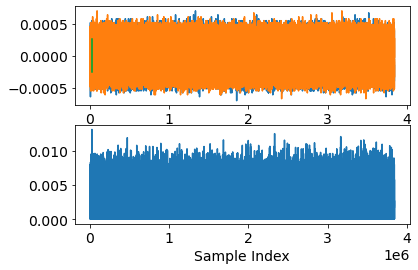

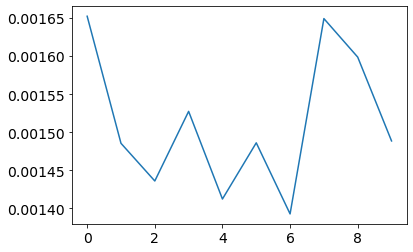

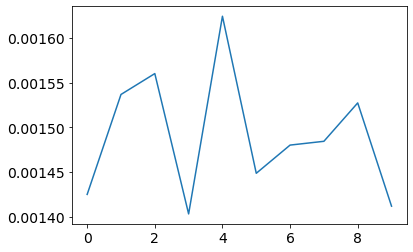

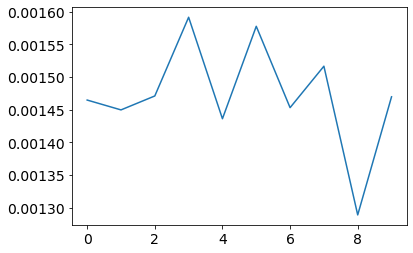

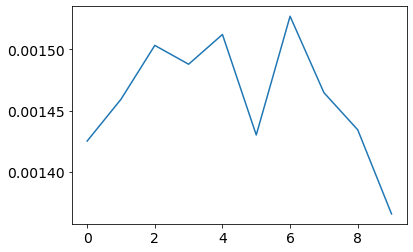

Errors Found: 4
Repeat Number: 9 Number of Errors: 4
Shout_meas_02-28-2024_08-22-41
The old lag 1018686
The new lag 1018758


<Figure size 432x288 with 0 Axes>

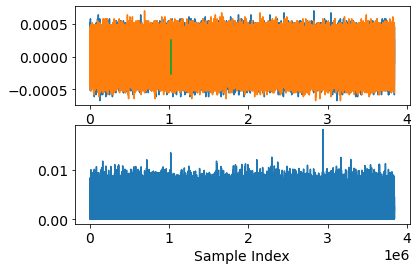

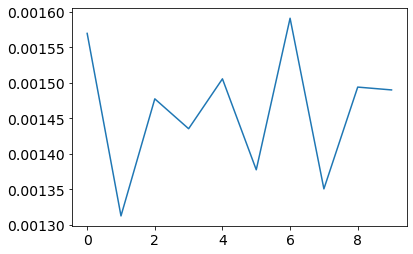

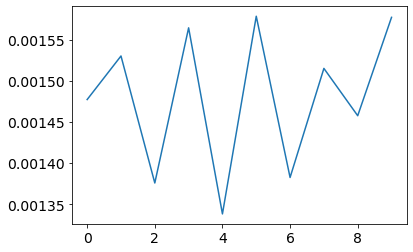

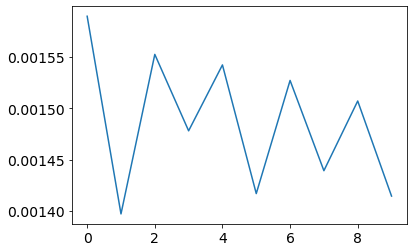

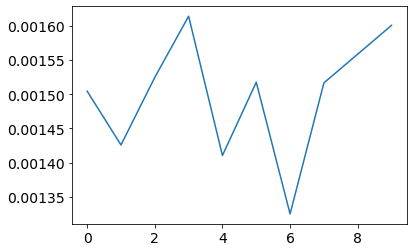

Repeat Number: 0 Number of Errors: 0
The old lag 882195
The old lag 882195


<Figure size 432x288 with 0 Axes>

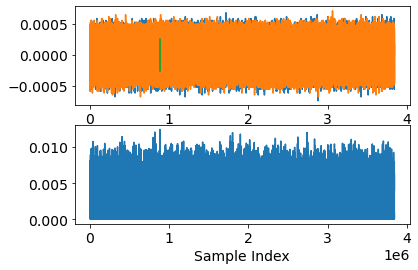

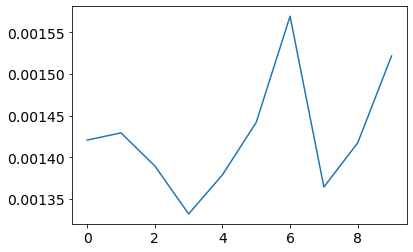

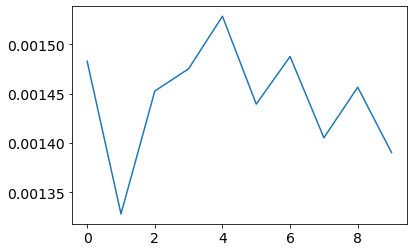

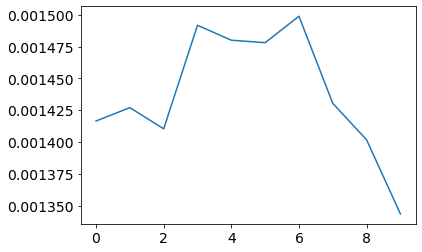

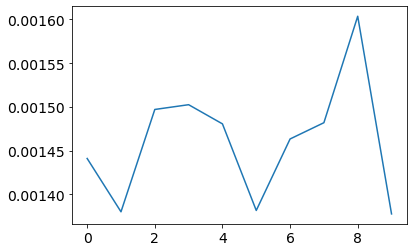

Errors Found: 4
Repeat Number: 1 Number of Errors: 4
The old lag 234077
The new lag 537181


<Figure size 432x288 with 0 Axes>

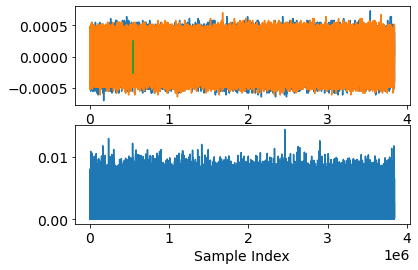

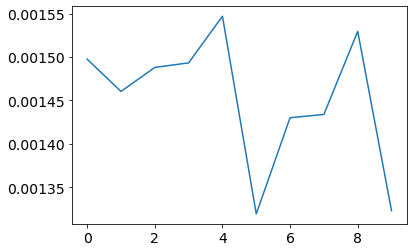

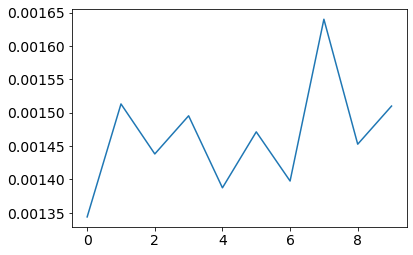

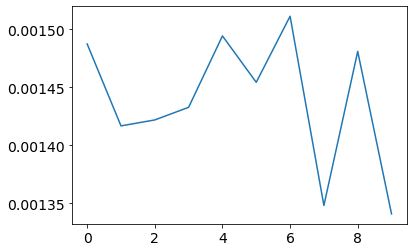

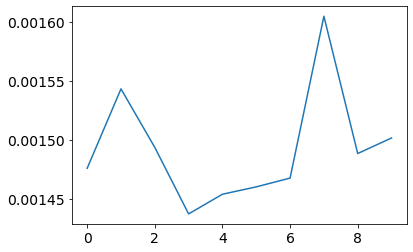

Repeat Number: 2 Number of Errors: 0
The old lag 558299
The new lag 1756886


<Figure size 432x288 with 0 Axes>

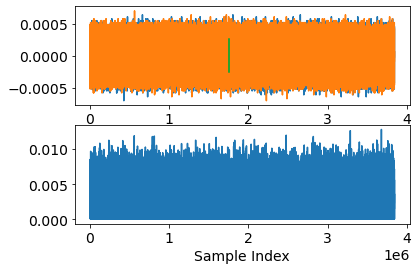

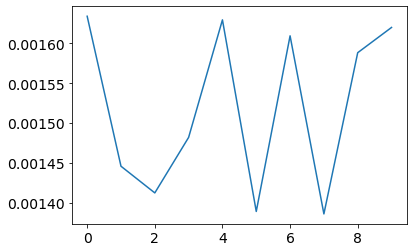

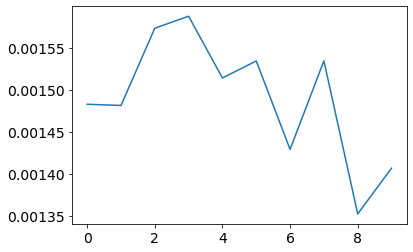

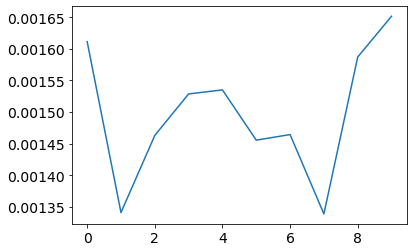

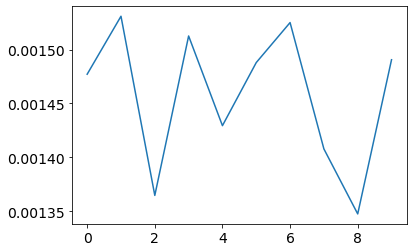

Repeat Number: 3 Number of Errors: 0
The old lag 1067687
The new lag 612396


<Figure size 432x288 with 0 Axes>

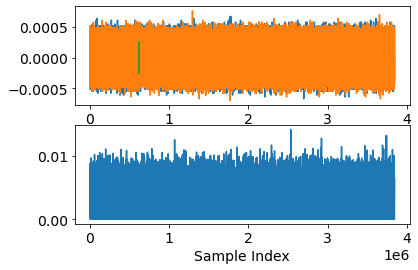

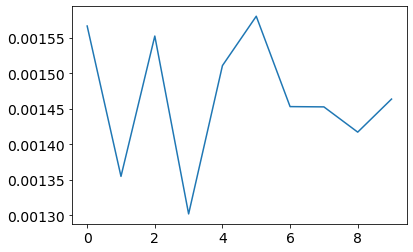

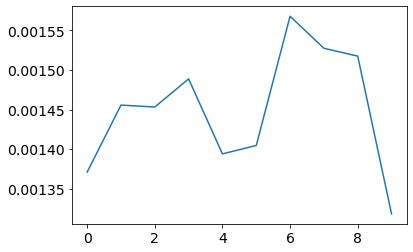

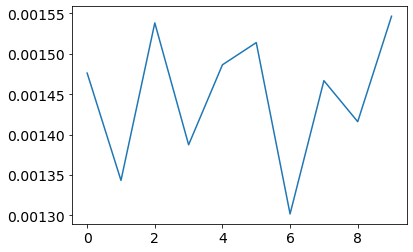

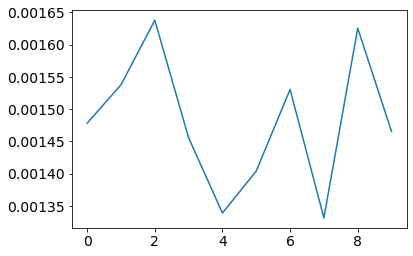

Errors Found: 3
Repeat Number: 4 Number of Errors: 3
The old lag 803133
The new lag 1799307


<Figure size 432x288 with 0 Axes>

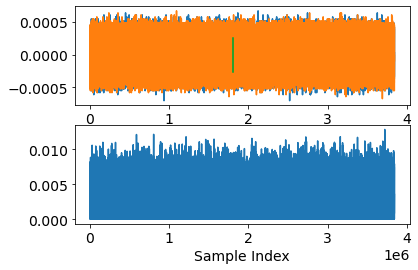

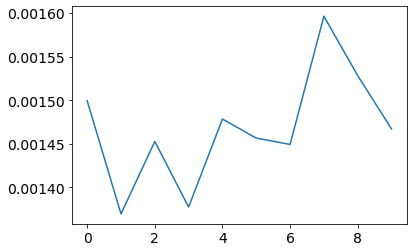

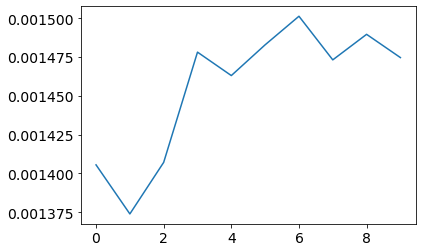

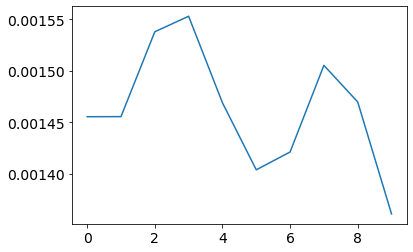

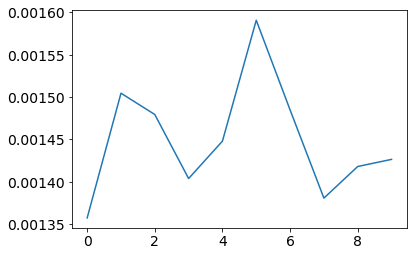

Errors Found: 2
Repeat Number: 5 Number of Errors: 2
The old lag 1416838
The new lag 389531


<Figure size 432x288 with 0 Axes>

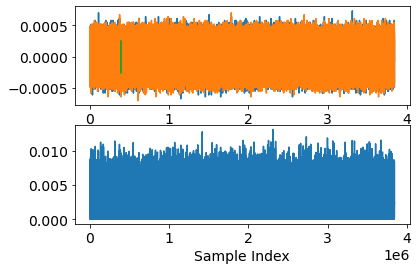

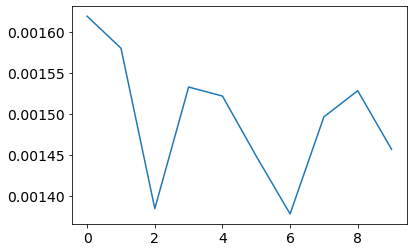

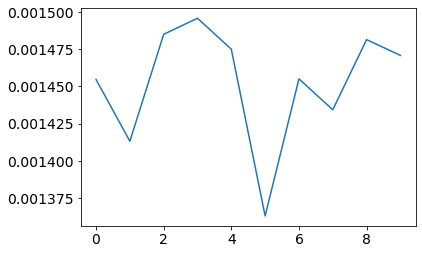

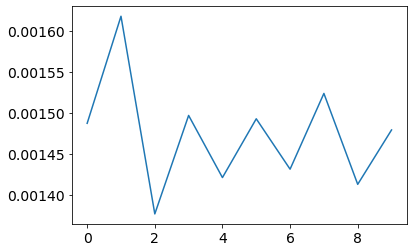

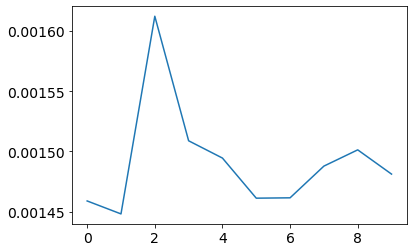

Errors Found: 4
Repeat Number: 6 Number of Errors: 4
The old lag 1136693
The old lag 1136693


<Figure size 432x288 with 0 Axes>

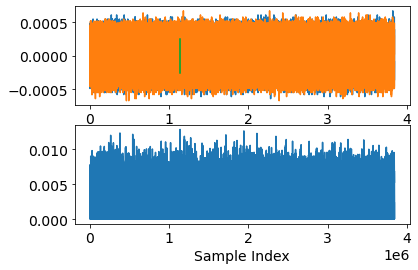

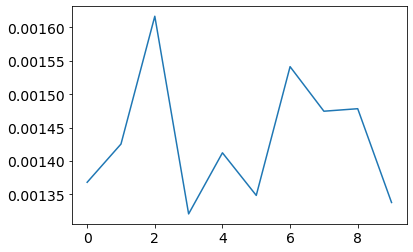

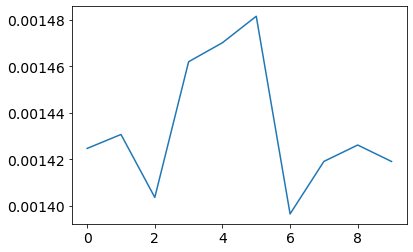

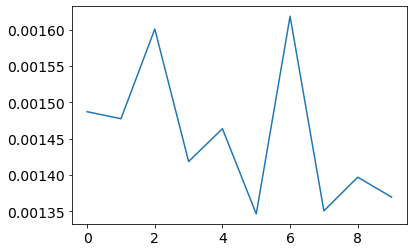

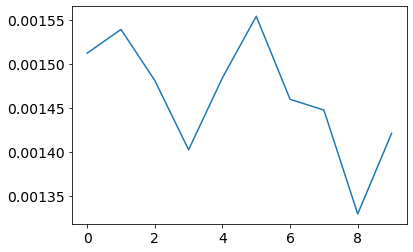

Repeat Number: 7 Number of Errors: 0
The old lag 1905853
The new lag 856607


<Figure size 432x288 with 0 Axes>

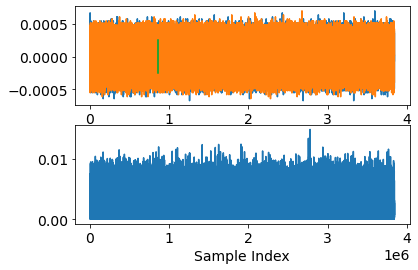

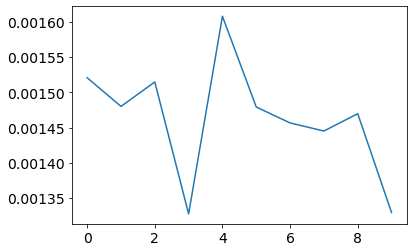

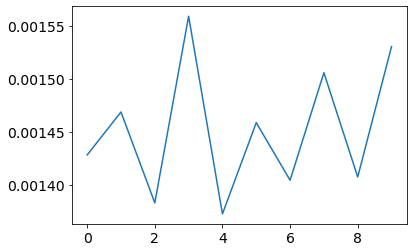

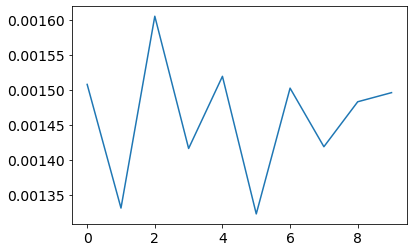

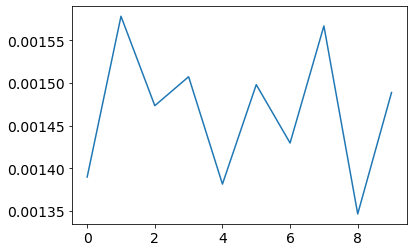

Repeat Number: 8 Number of Errors: 0
The old lag 170522
The new lag 576502


<Figure size 432x288 with 0 Axes>

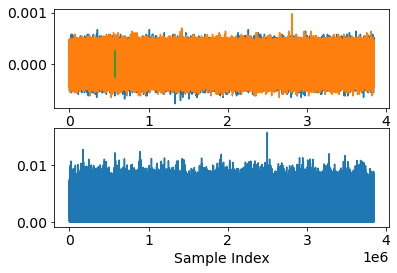

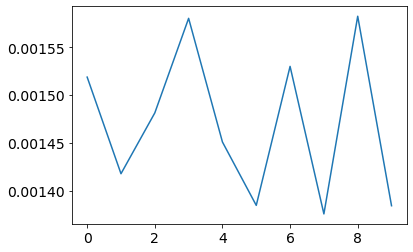

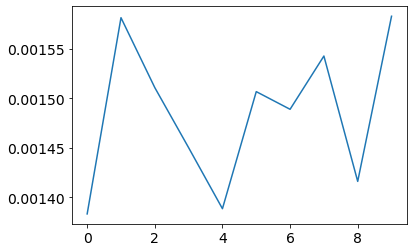

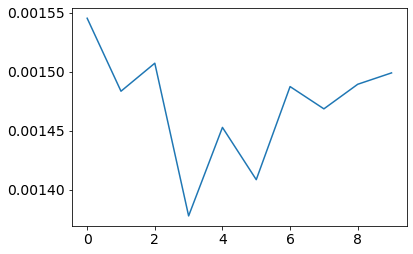

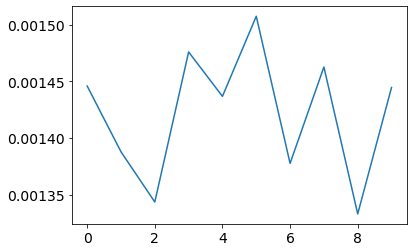

Repeat Number: 9 Number of Errors: 0
Shout_meas_02-28-2024_08-40-50
The old lag 1222876
The old lag 1222876


<Figure size 432x288 with 0 Axes>

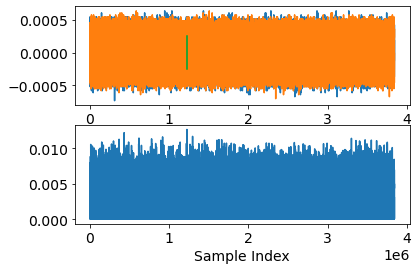

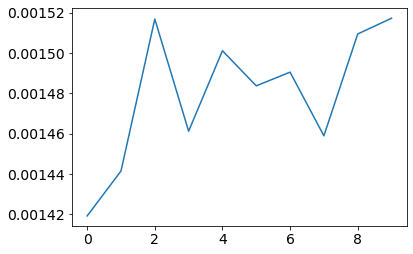

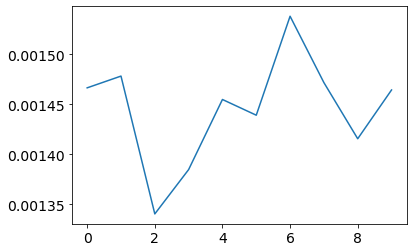

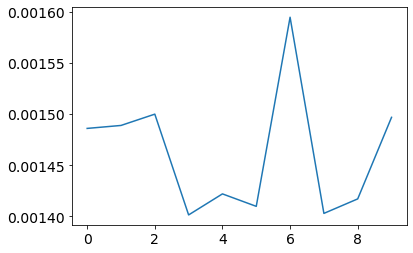

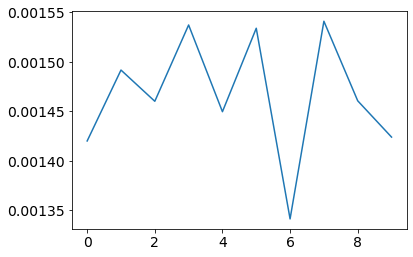

Repeat Number: 0 Number of Errors: 0
The old lag 1606248
The new lag 918304


<Figure size 432x288 with 0 Axes>

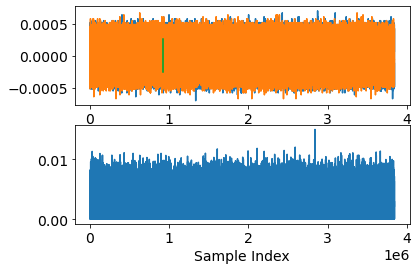

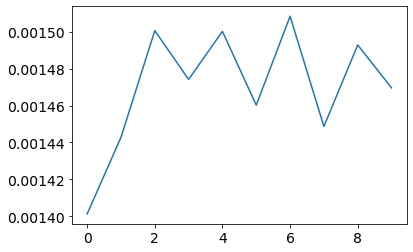

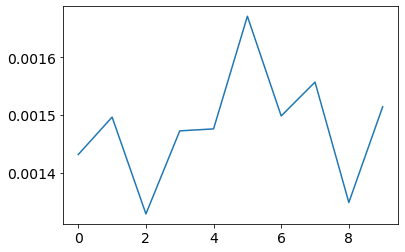

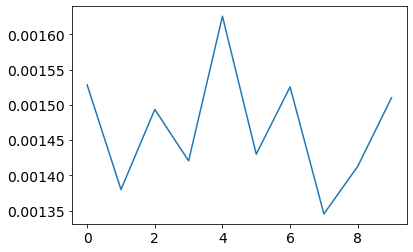

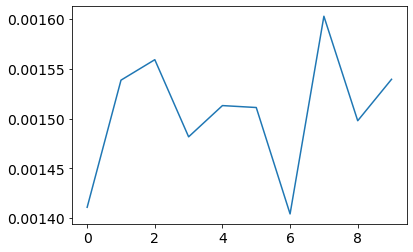

Repeat Number: 1 Number of Errors: 0
The old lag 716855
The old lag 716855


<Figure size 432x288 with 0 Axes>

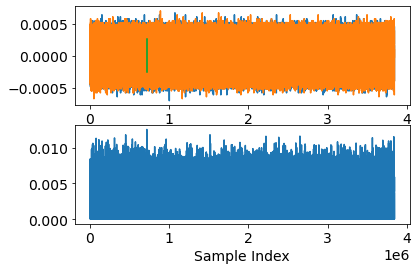

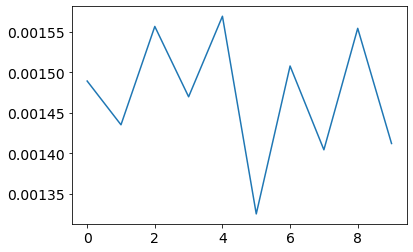

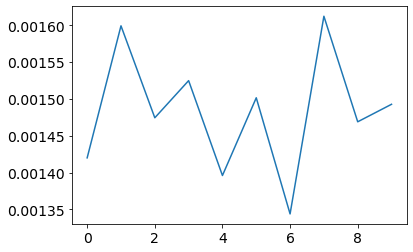

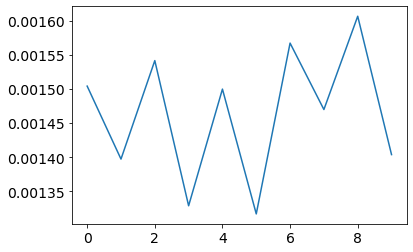

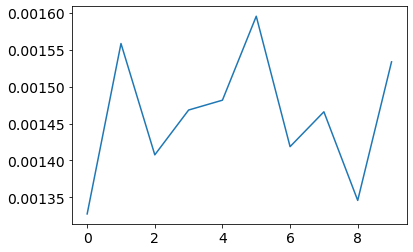

Repeat Number: 2 Number of Errors: 0
The old lag 436744
The old lag 436744


<Figure size 432x288 with 0 Axes>

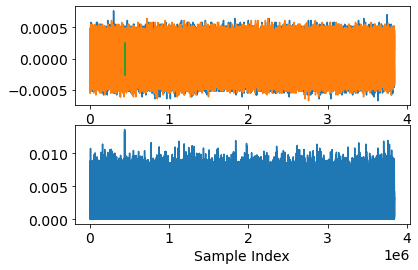

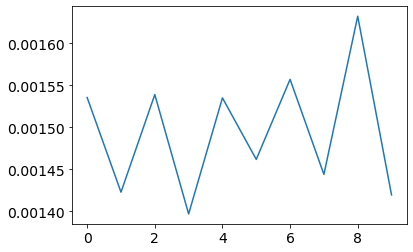

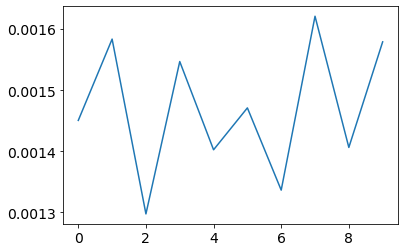

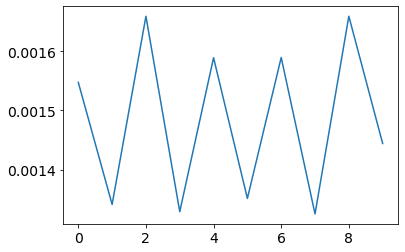

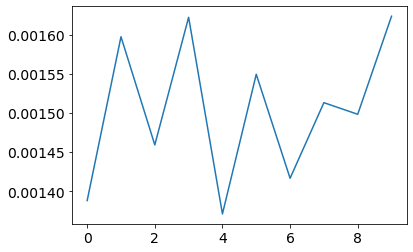

Repeat Number: 3 Number of Errors: 0
The old lag 590617
The new lag 1734395


<Figure size 432x288 with 0 Axes>

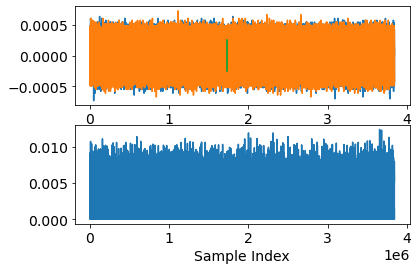

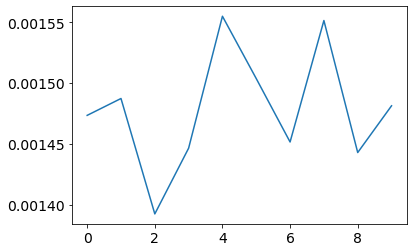

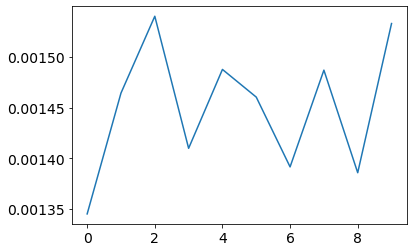

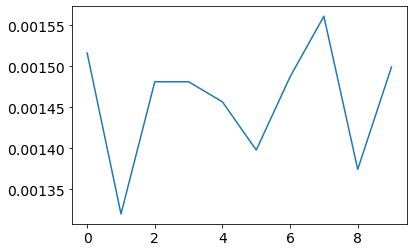

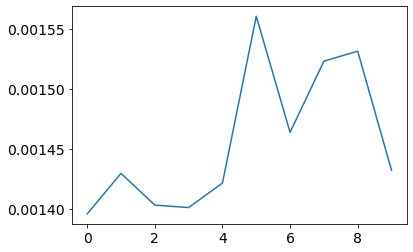

Errors Found: 2
Repeat Number: 4 Number of Errors: 2
The old lag 291397
The new lag 1876535


<Figure size 432x288 with 0 Axes>

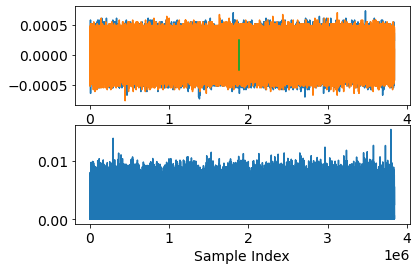

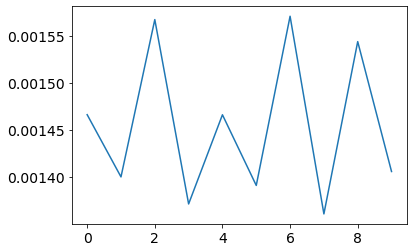

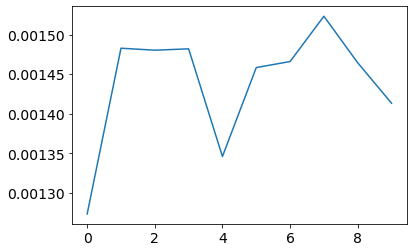

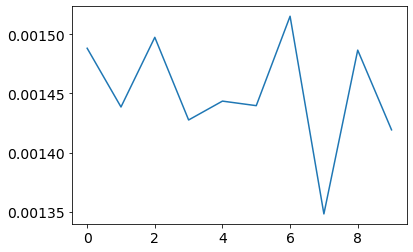

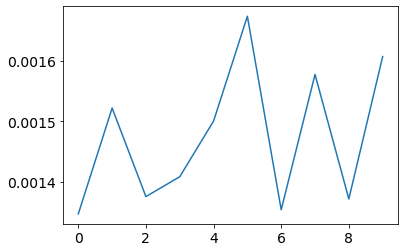

Repeat Number: 5 Number of Errors: 0
The old lag 1596367
The new lag 1596439


<Figure size 432x288 with 0 Axes>

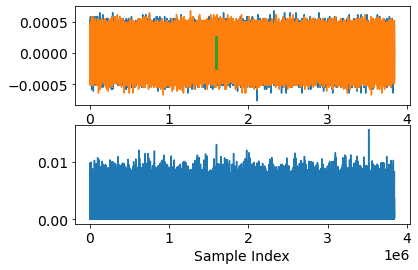

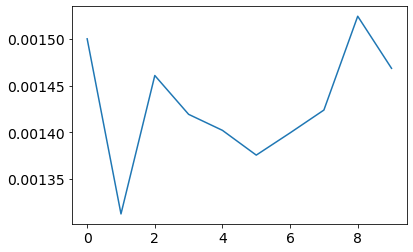

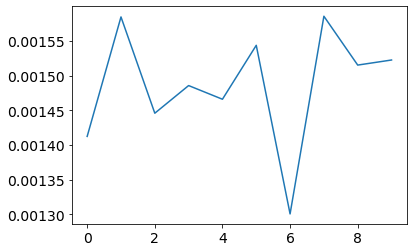

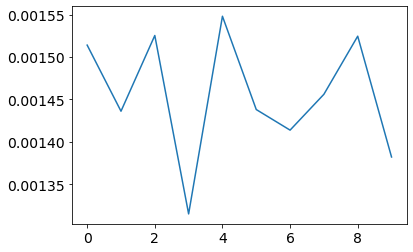

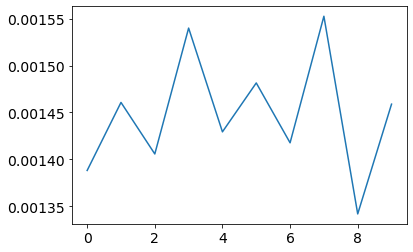

Repeat Number: 6 Number of Errors: 0
The old lag 1394990
The new lag 1394967


<Figure size 432x288 with 0 Axes>

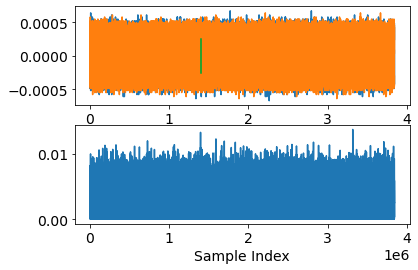

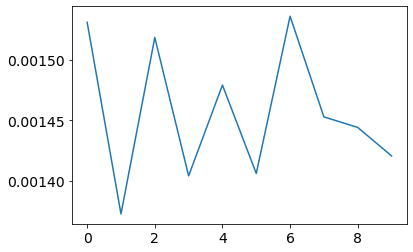

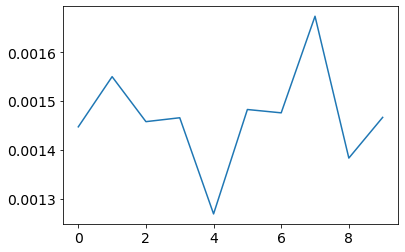

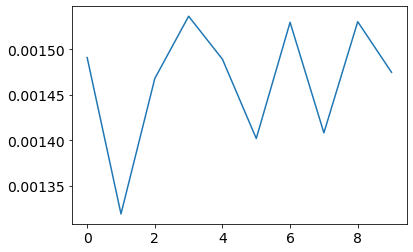

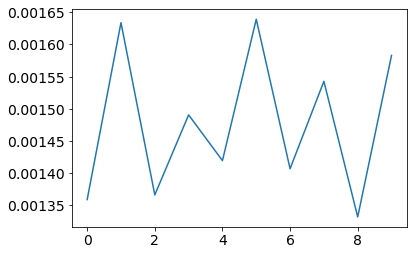

Repeat Number: 7 Number of Errors: 0
The old lag 315462
The old lag 315462


<Figure size 432x288 with 0 Axes>

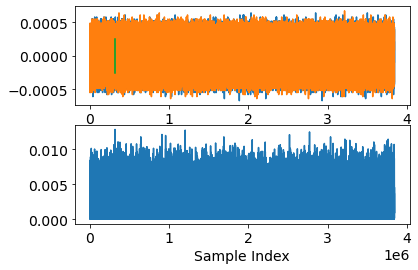

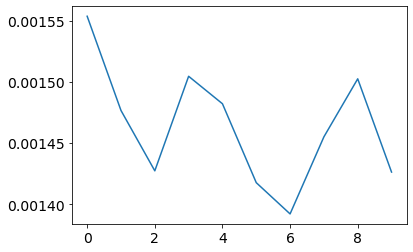

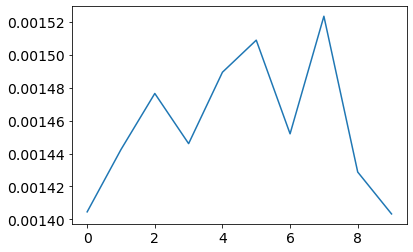

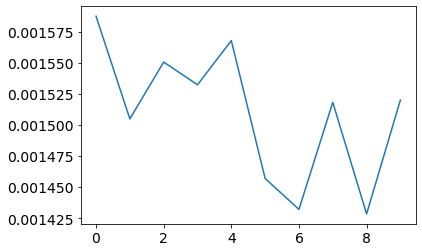

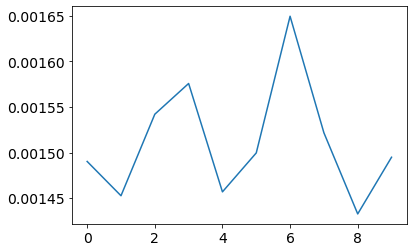

Errors Found: 2
Repeat Number: 8 Number of Errors: 2
The old lag 854973
The old lag 854973


<Figure size 432x288 with 0 Axes>

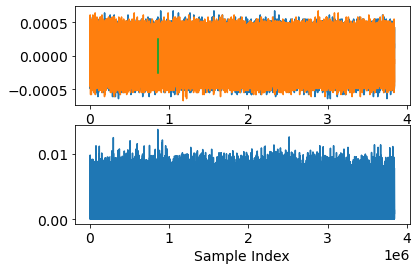

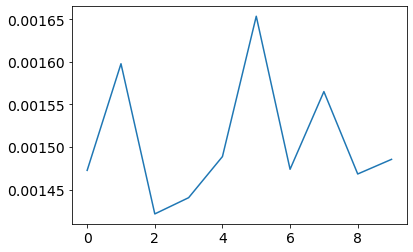

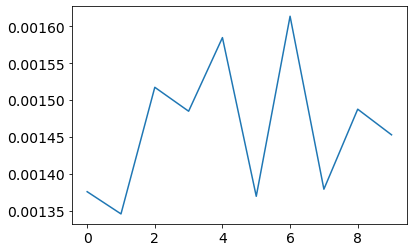

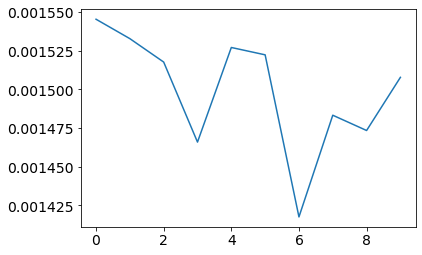

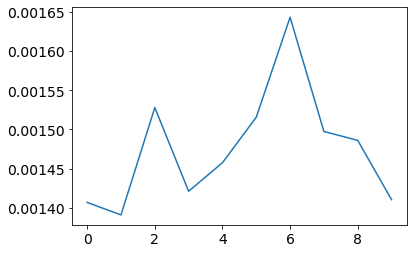

Errors Found: 4
Repeat Number: 9 Number of Errors: 4
Shout_meas_02-28-2024_08-51-20
The old lag 1138927
The old lag 1138927


<Figure size 432x288 with 0 Axes>

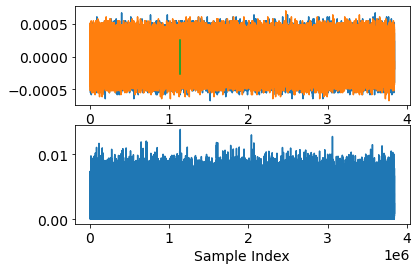

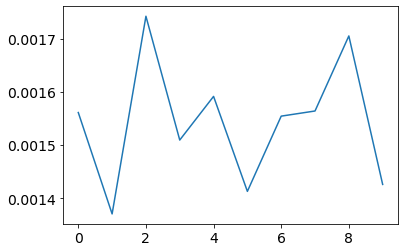

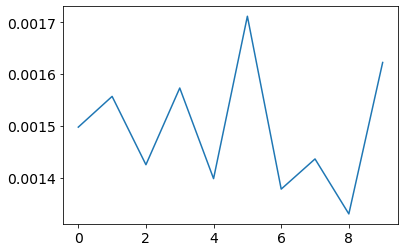

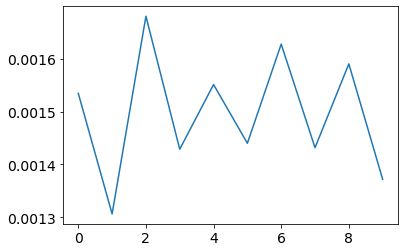

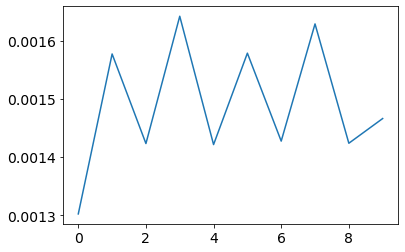

Repeat Number: 0 Number of Errors: 0
The old lag 858805
The old lag 858805


<Figure size 432x288 with 0 Axes>

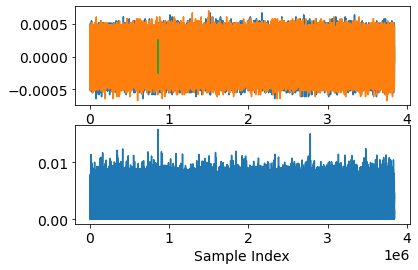

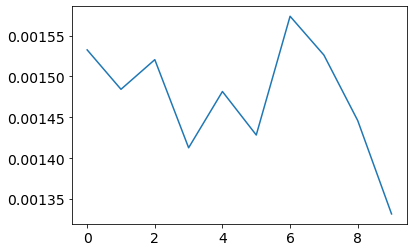

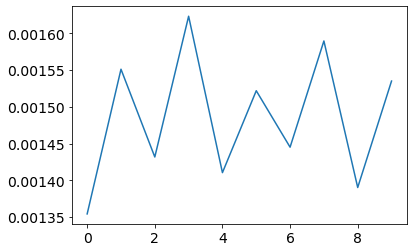

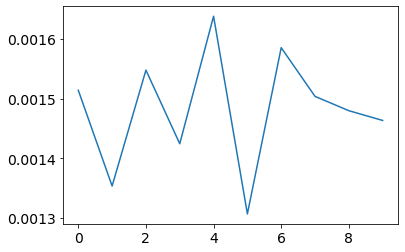

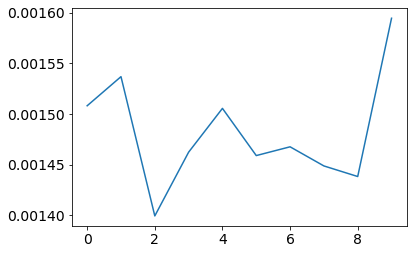

Repeat Number: 1 Number of Errors: 0
The old lag 448448
The new lag 484802


<Figure size 432x288 with 0 Axes>

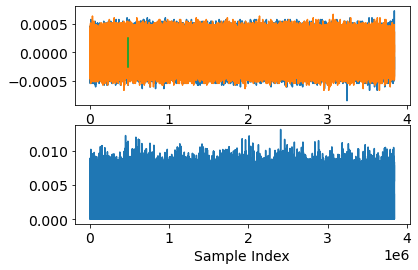

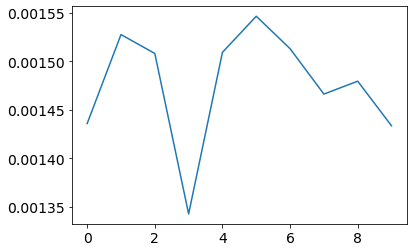

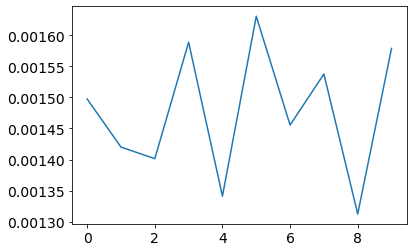

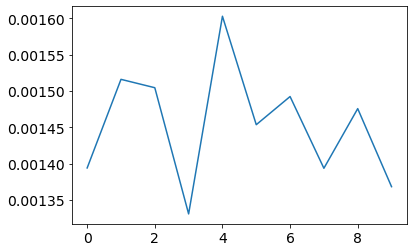

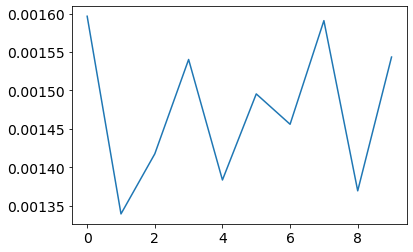

Repeat Number: 2 Number of Errors: 0
The old lag 377245
The old lag 377245


<Figure size 432x288 with 0 Axes>

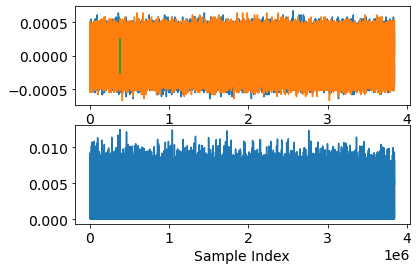

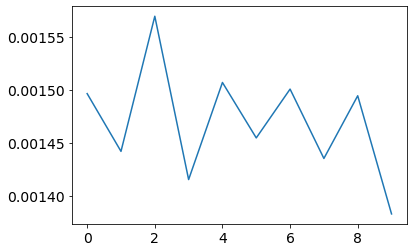

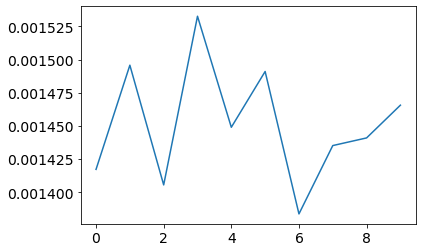

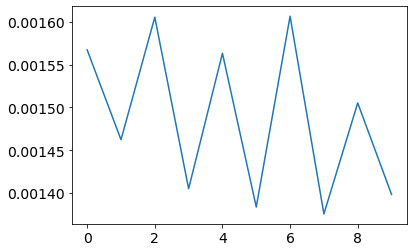

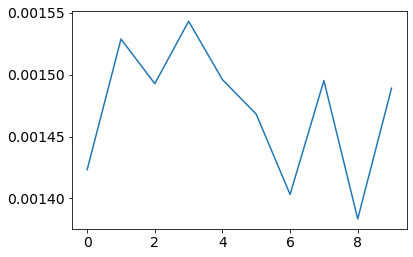

Repeat Number: 3 Number of Errors: 0
The old lag 1527755
The old lag 1527755


<Figure size 432x288 with 0 Axes>

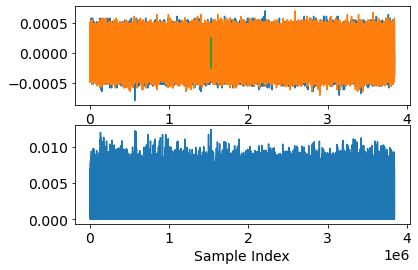

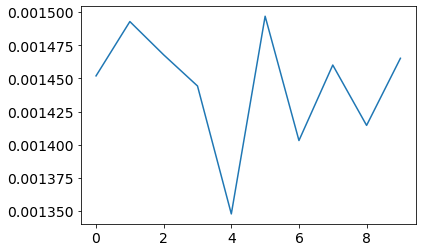

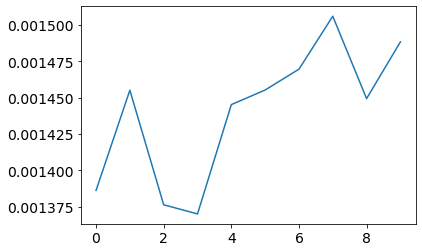

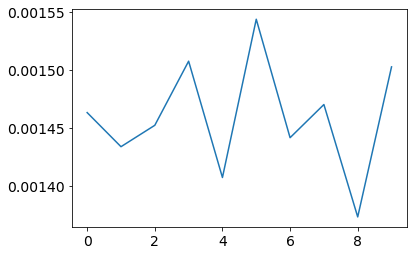

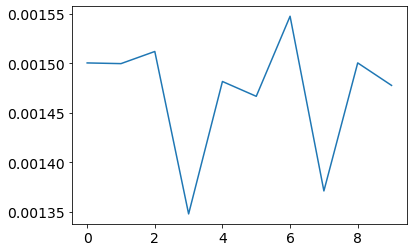

Errors Found: 3
Repeat Number: 4 Number of Errors: 3
The old lag 132089
The new lag 146728


<Figure size 432x288 with 0 Axes>

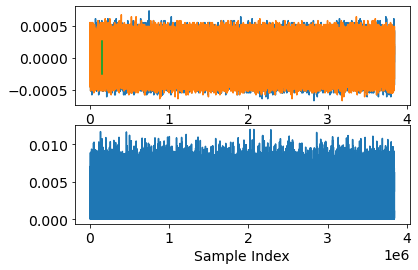

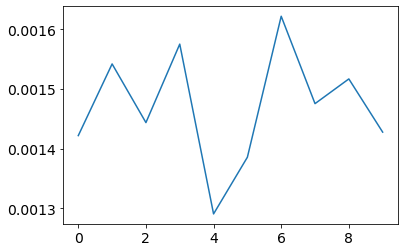

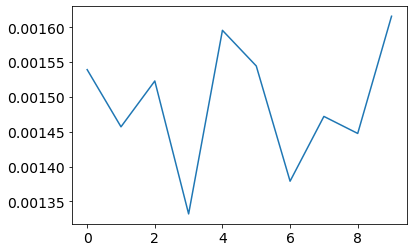

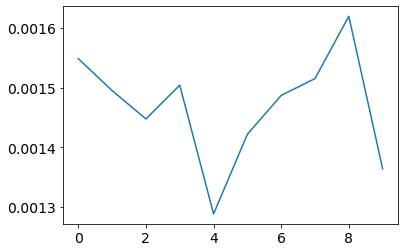

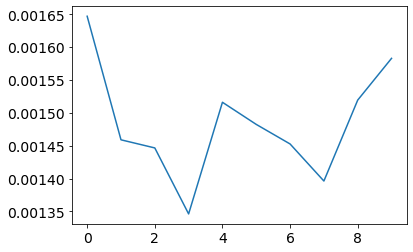

Errors Found: 3
Repeat Number: 5 Number of Errors: 3
The old lag 1615581
The new lag 1615581


<Figure size 432x288 with 0 Axes>

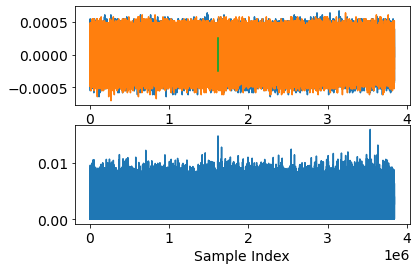

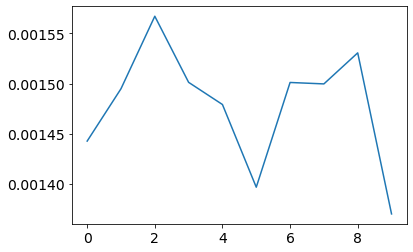

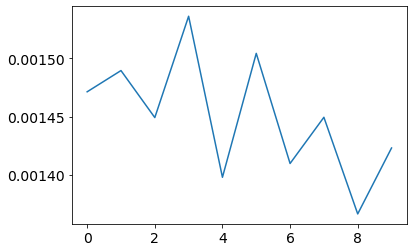

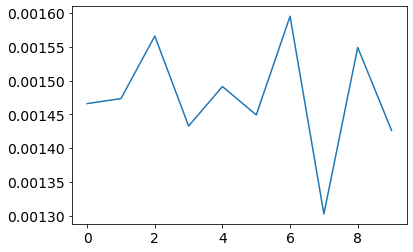

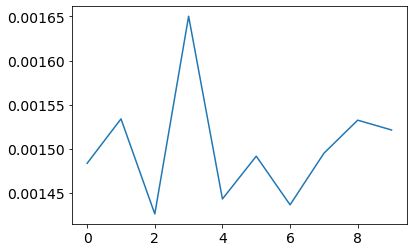

Repeat Number: 6 Number of Errors: 0
The old lag 1440448
The new lag 1414109


<Figure size 432x288 with 0 Axes>

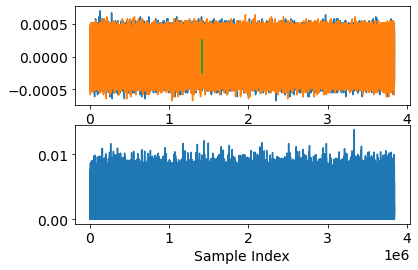

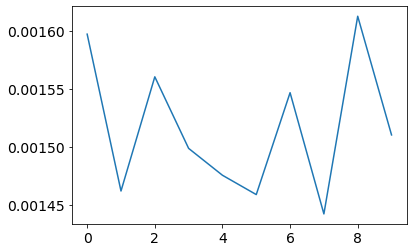

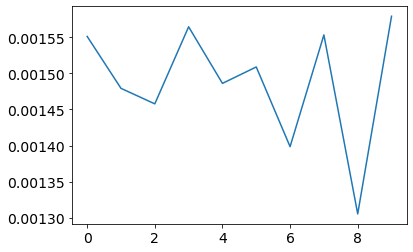

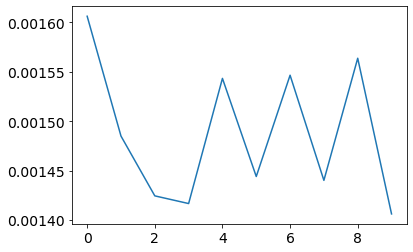

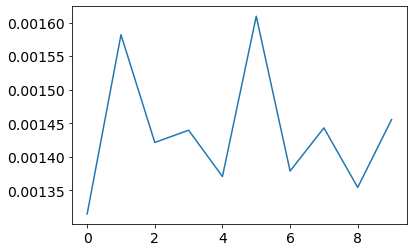

Repeat Number: 7 Number of Errors: 0
The old lag 1212630
The old lag 1212630


<Figure size 432x288 with 0 Axes>

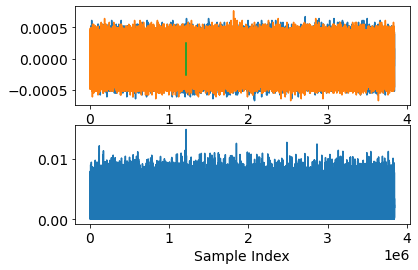

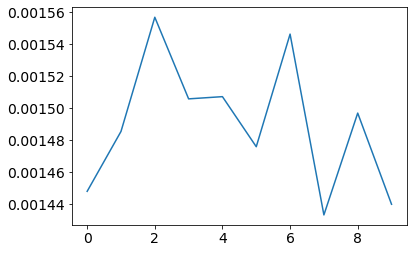

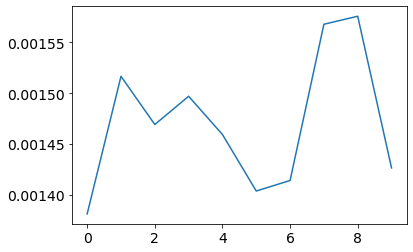

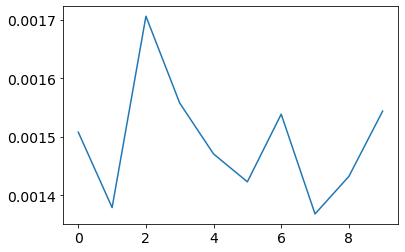

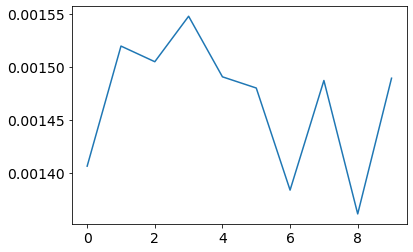

Repeat Number: 8 Number of Errors: 0
The old lag 3150
The new lag 1011166


<Figure size 432x288 with 0 Axes>

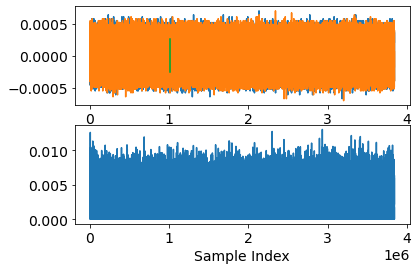

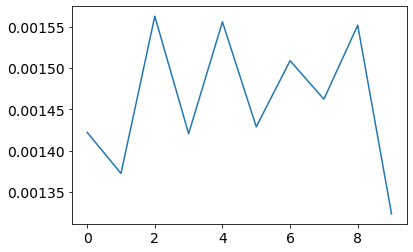

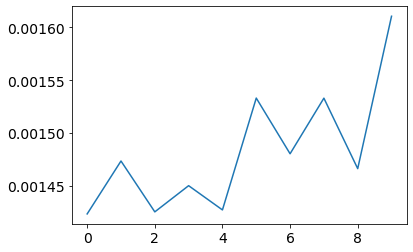

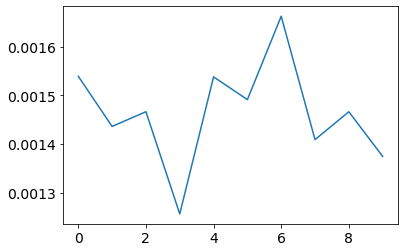

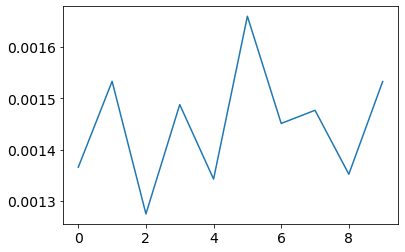

Repeat Number: 9 Number of Errors: 0
Shout_meas_02-28-2024_09-21-25
The old lag 1190147
The new lag 304727


<Figure size 432x288 with 0 Axes>

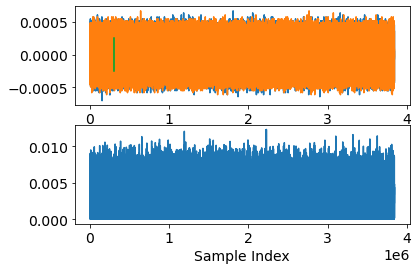

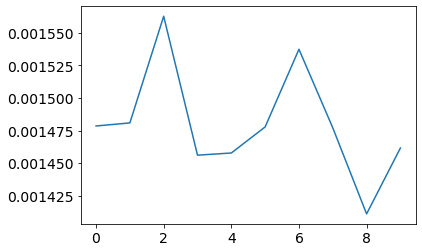

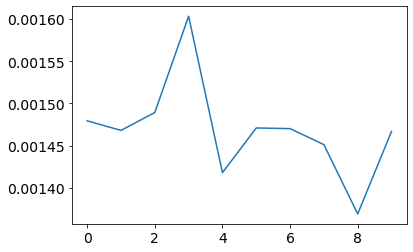

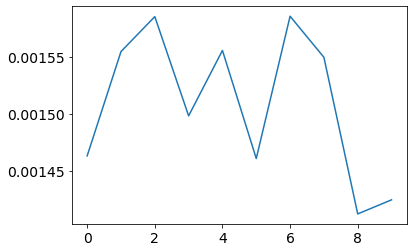

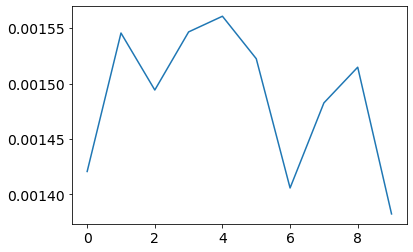

Errors Found: 1
Repeat Number: 0 Number of Errors: 1
The old lag 1124139
The old lag 1124139


<Figure size 432x288 with 0 Axes>

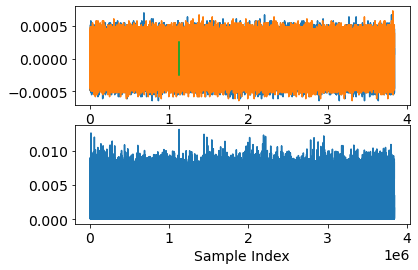

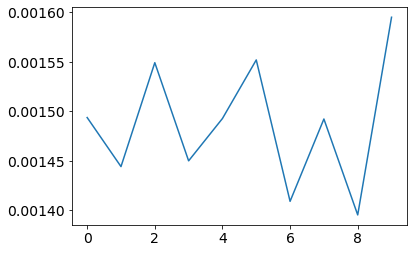

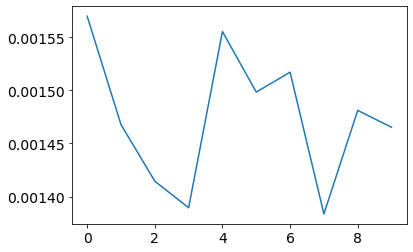

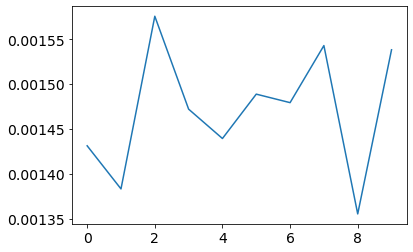

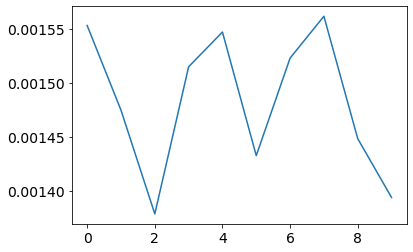

Errors Found: 4
Repeat Number: 1 Number of Errors: 4
The old lag 1377785
The old lag 1377785


<Figure size 432x288 with 0 Axes>

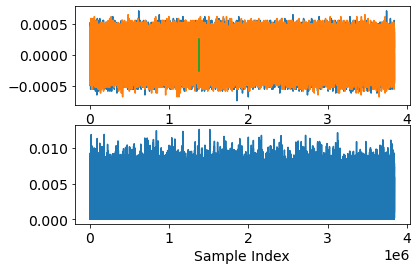

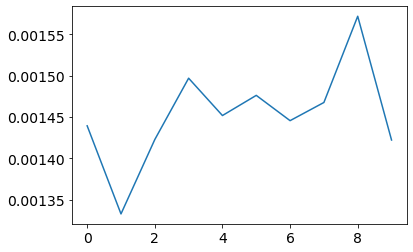

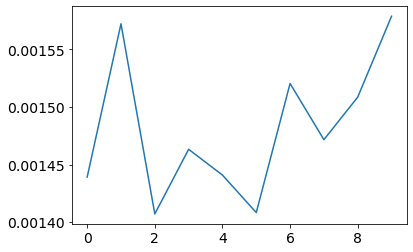

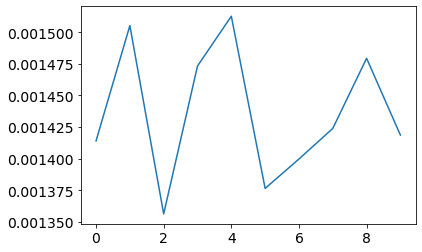

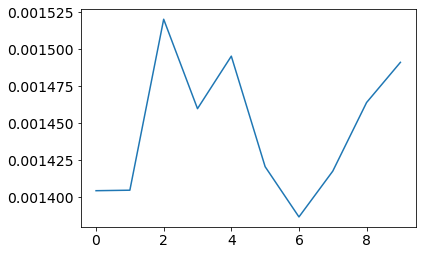

Errors Found: 1
Repeat Number: 2 Number of Errors: 1
The old lag 1576872
The old lag 1576872


<Figure size 432x288 with 0 Axes>

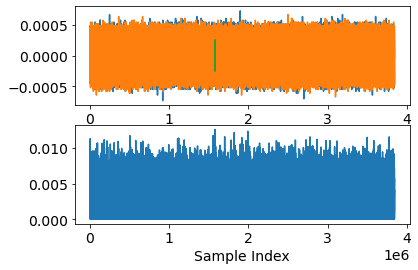

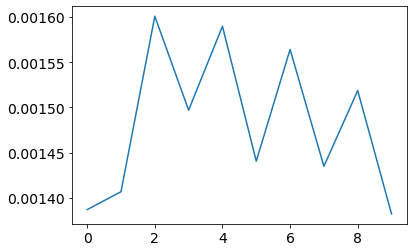

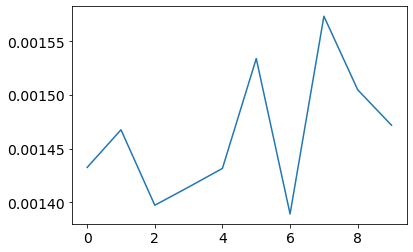

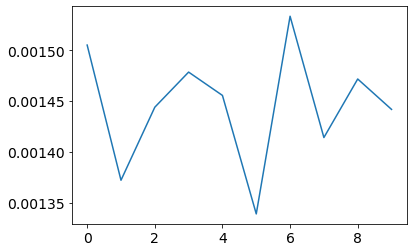

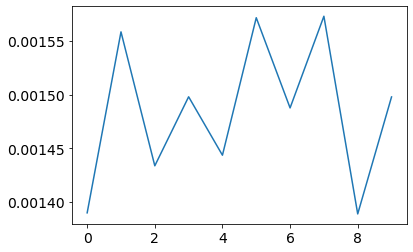

Repeat Number: 3 Number of Errors: 0
The old lag 286377
The new lag 1296794


<Figure size 432x288 with 0 Axes>

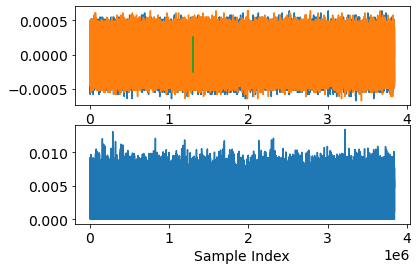

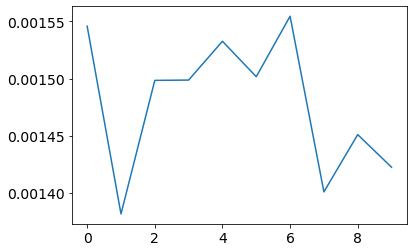

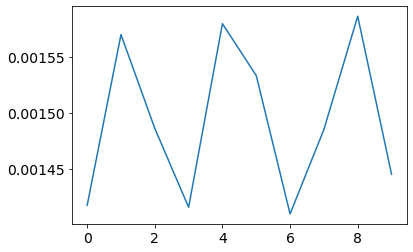

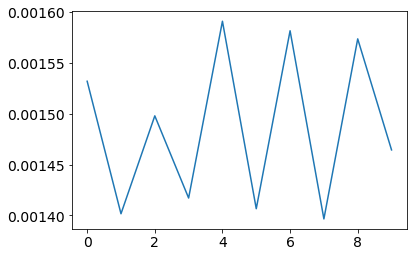

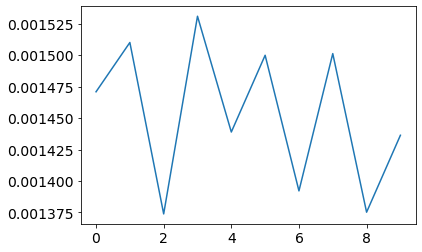

Errors Found: 1
Repeat Number: 4 Number of Errors: 1
The old lag 1016689
The old lag 1016689


<Figure size 432x288 with 0 Axes>

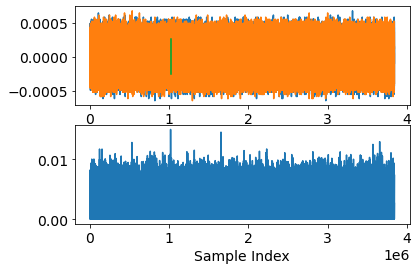

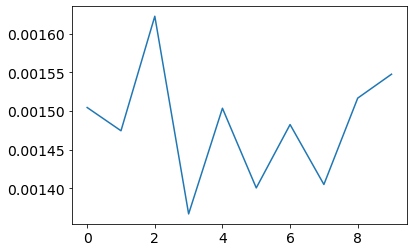

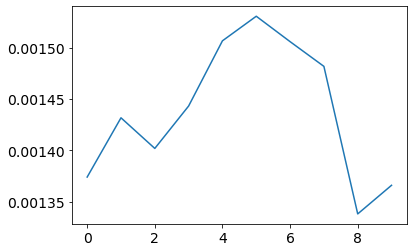

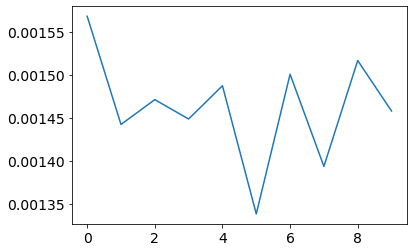

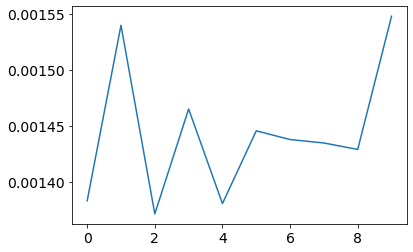

Repeat Number: 5 Number of Errors: 0
The old lag 1289923
The old lag 1289923


<Figure size 432x288 with 0 Axes>

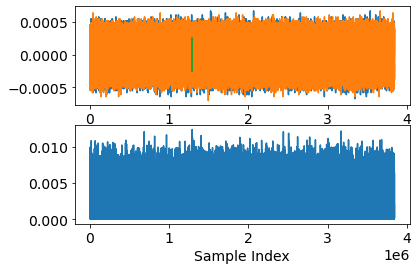

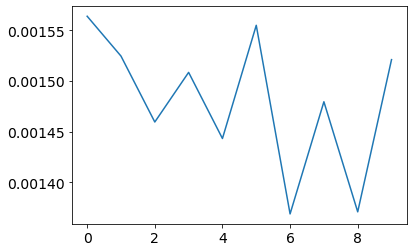

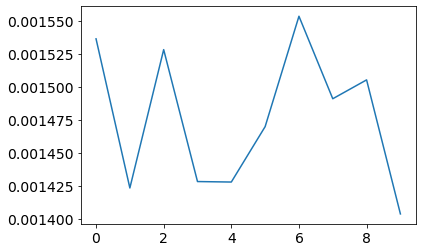

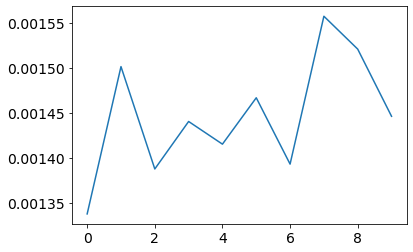

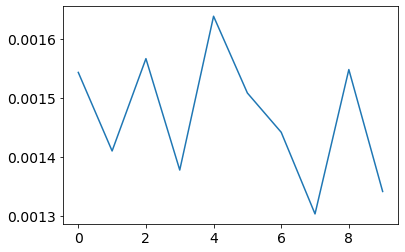

Errors Found: 4
Repeat Number: 6 Number of Errors: 4
The old lag 189956
The old lag 189956


<Figure size 432x288 with 0 Axes>

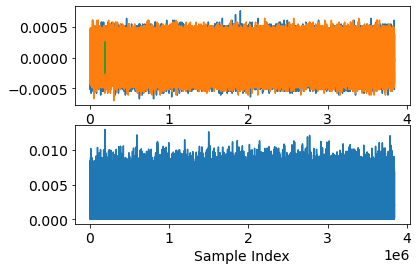

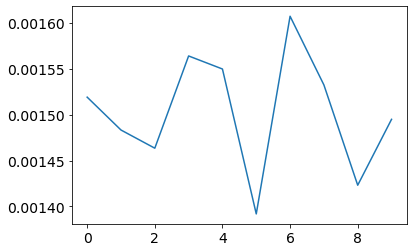

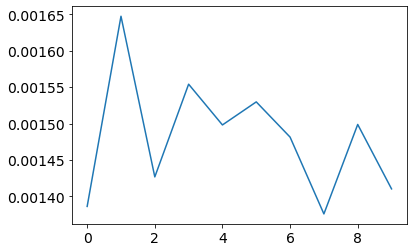

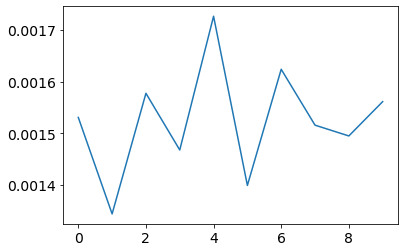

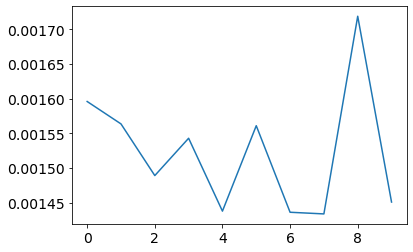

Errors Found: 1
Repeat Number: 7 Number of Errors: 1
The old lag 1801830
The new lag 658184


<Figure size 432x288 with 0 Axes>

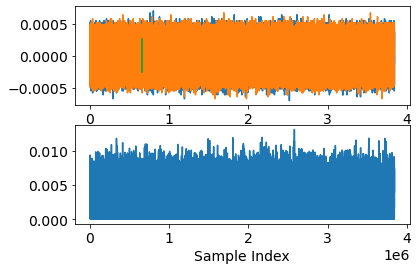

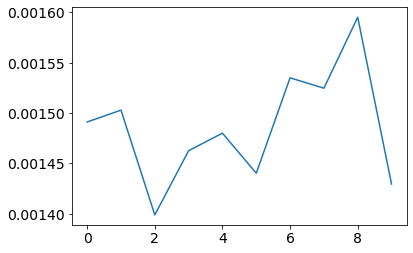

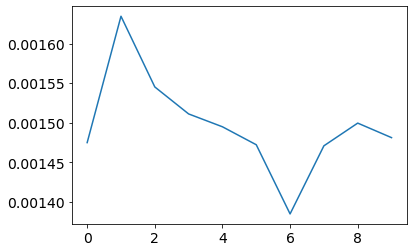

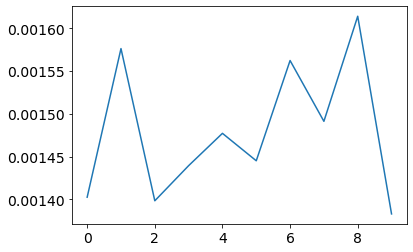

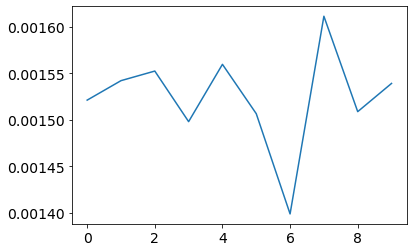

Repeat Number: 8 Number of Errors: 0
The old lag 1626333
The new lag 263168


<Figure size 432x288 with 0 Axes>

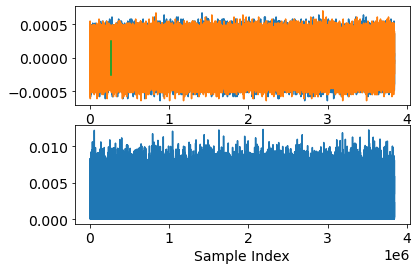

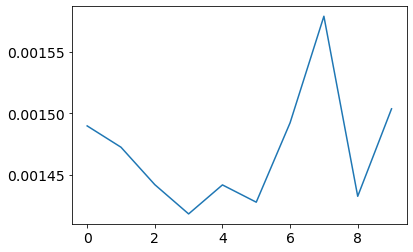

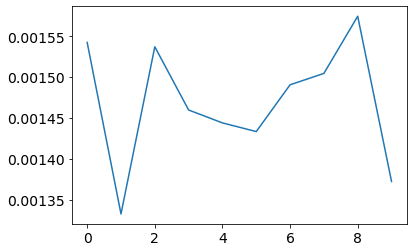

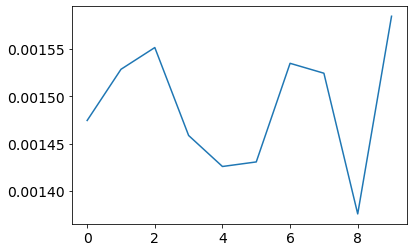

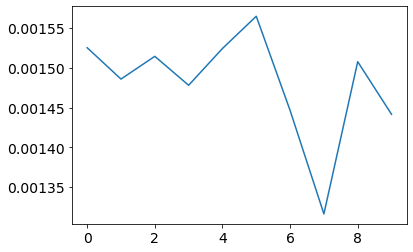

Errors Found: 4
Repeat Number: 9 Number of Errors: 4
Shout_meas_02-28-2024_09-05-40
The old lag 5012
The old lag 5012


<Figure size 432x288 with 0 Axes>

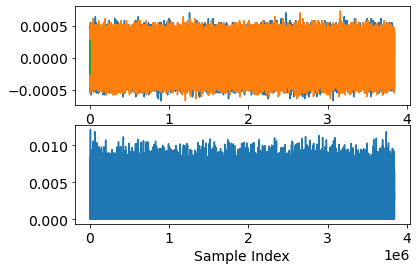

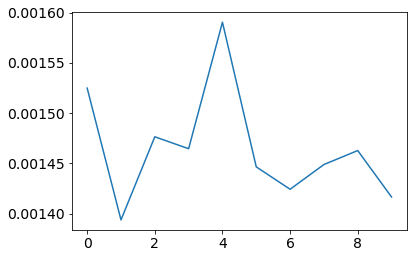

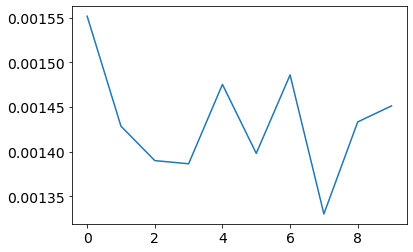

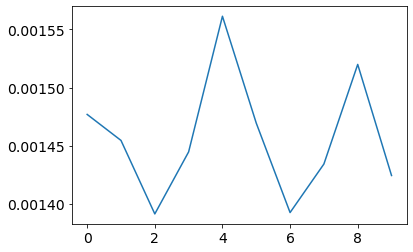

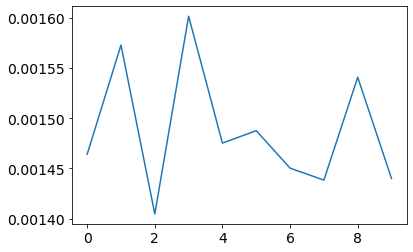

Errors Found: 1
Repeat Number: 0 Number of Errors: 1
The old lag 874670
The old lag 874670


<Figure size 432x288 with 0 Axes>

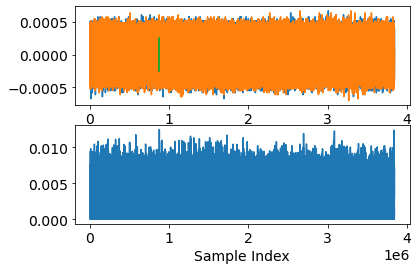

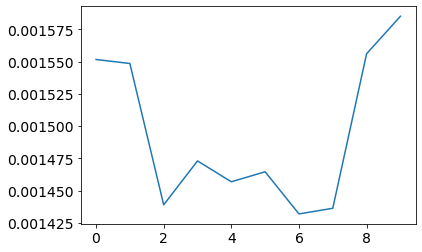

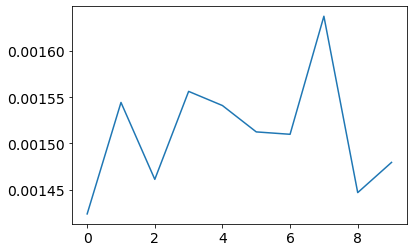

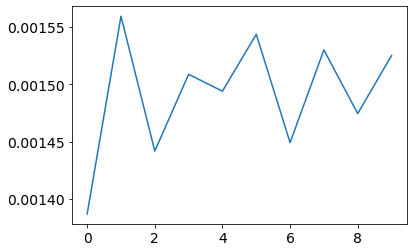

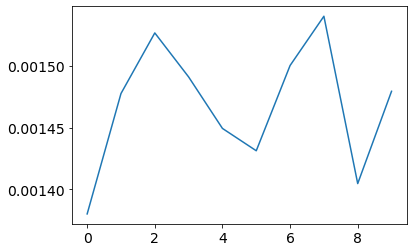

Errors Found: 2
Repeat Number: 1 Number of Errors: 2
The old lag 701684
The old lag 701684


<Figure size 432x288 with 0 Axes>

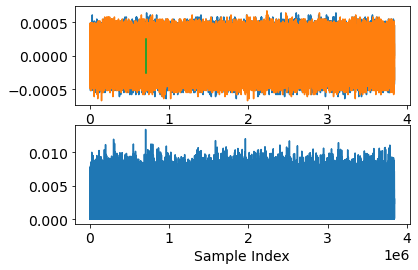

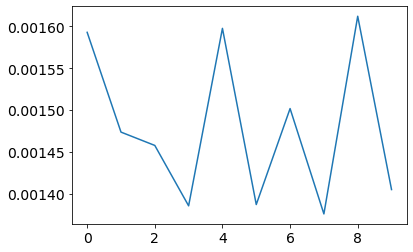

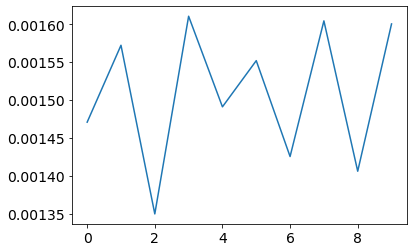

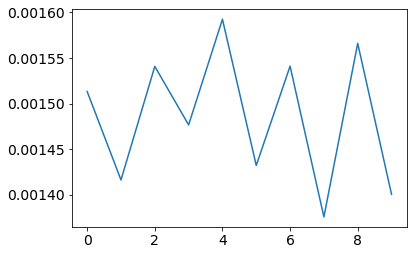

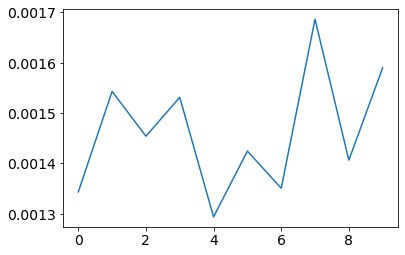

Repeat Number: 2 Number of Errors: 0
The old lag 1584327
The new lag 500180


<Figure size 432x288 with 0 Axes>

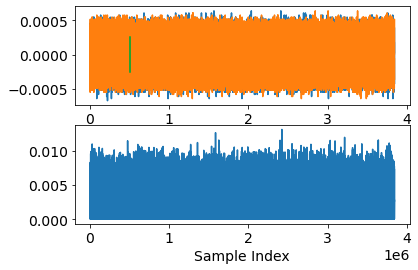

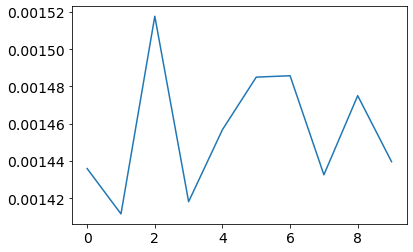

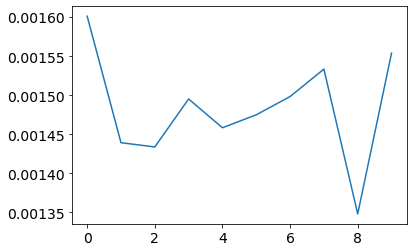

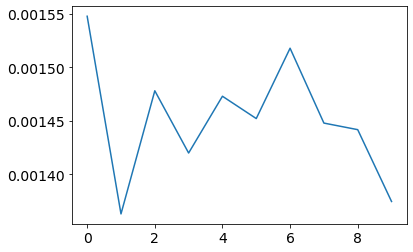

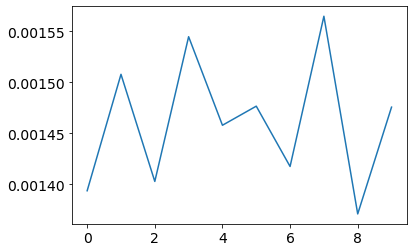

Repeat Number: 3 Number of Errors: 0
The old lag 663456
The new lag 539149


<Figure size 432x288 with 0 Axes>

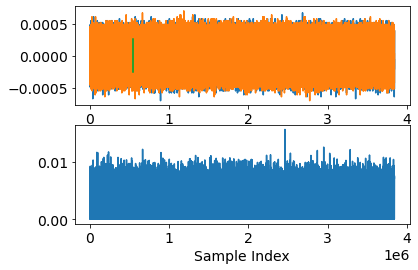

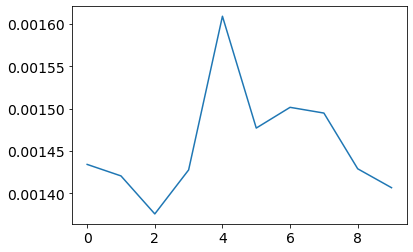

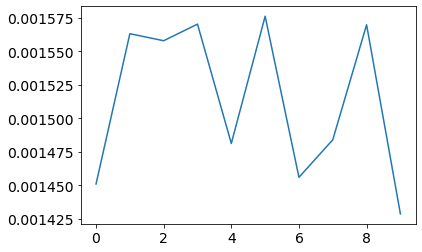

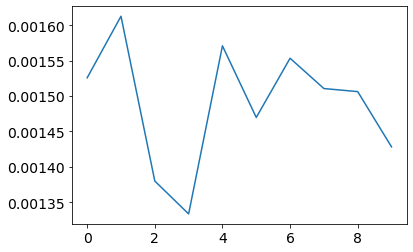

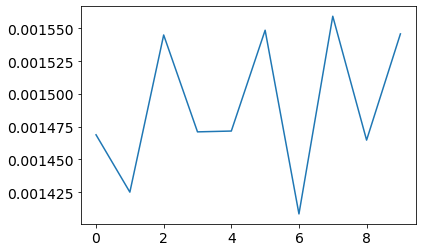

Repeat Number: 4 Number of Errors: 0
The old lag 1212679
The new lag 1609171


<Figure size 432x288 with 0 Axes>

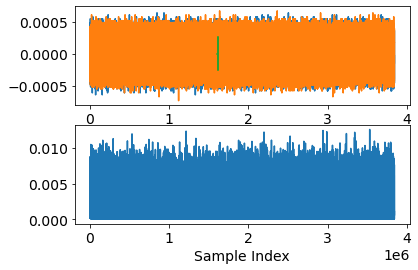

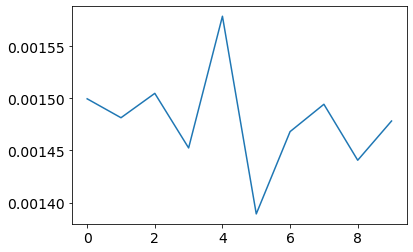

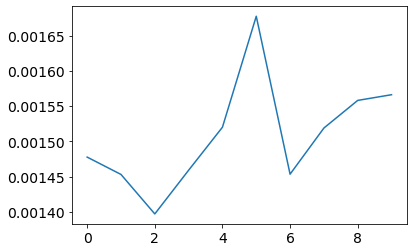

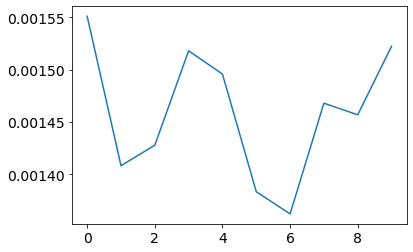

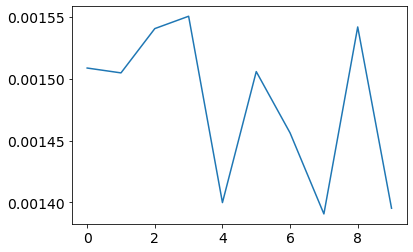

Errors Found: 2
Repeat Number: 5 Number of Errors: 2
The old lag 1187739
The old lag 1187739


<Figure size 432x288 with 0 Axes>

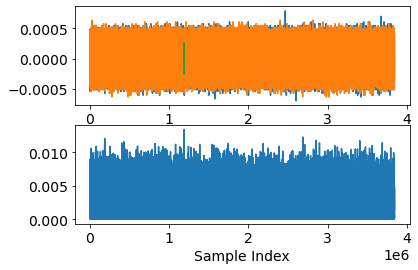

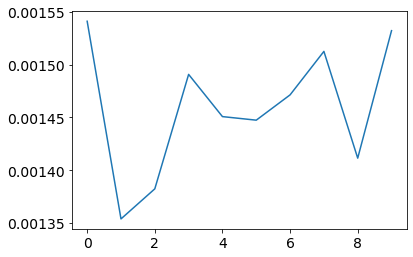

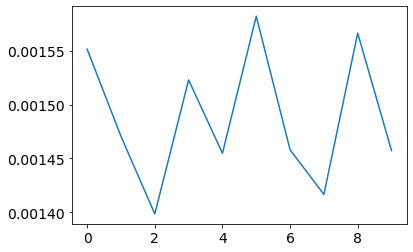

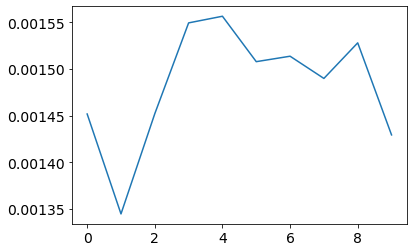

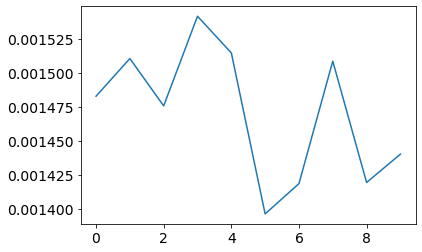

Errors Found: 1
Repeat Number: 6 Number of Errors: 1
The old lag 1486666
The old lag 1486666


<Figure size 432x288 with 0 Axes>

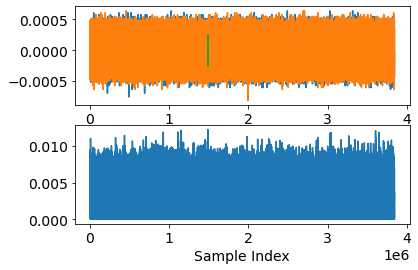

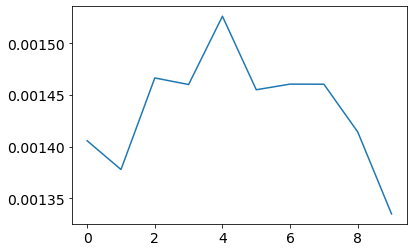

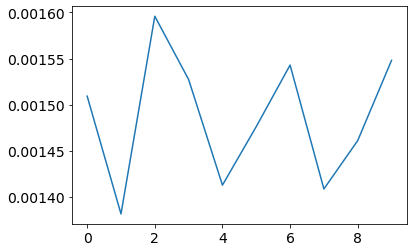

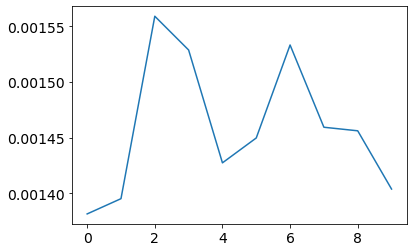

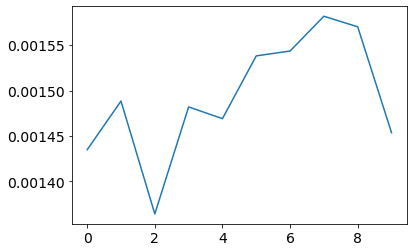

Errors Found: 1
Repeat Number: 7 Number of Errors: 1
The old lag 1178332
The old lag 1178332


<Figure size 432x288 with 0 Axes>

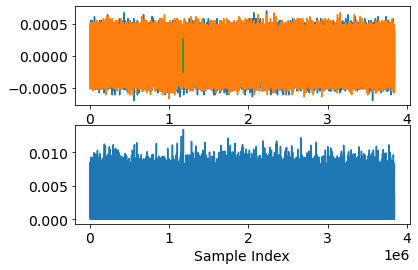

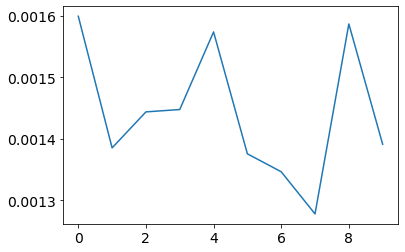

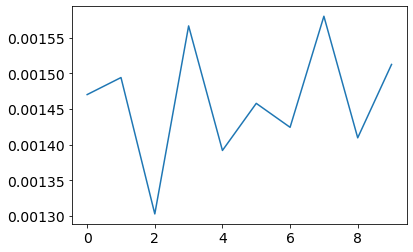

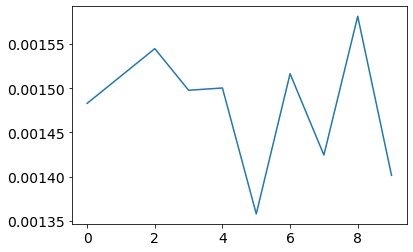

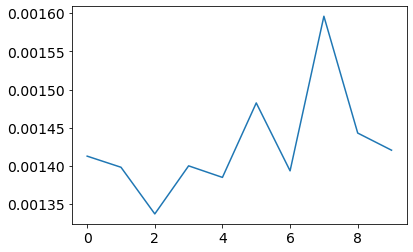

Repeat Number: 8 Number of Errors: 0
The old lag 640132
The new lag 1346371


<Figure size 432x288 with 0 Axes>

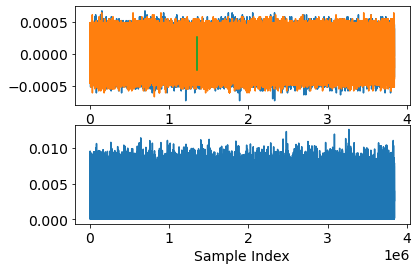

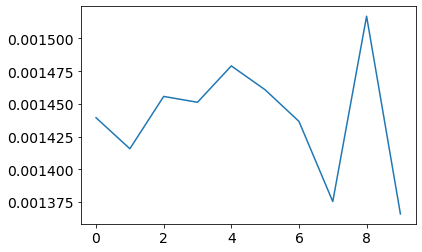

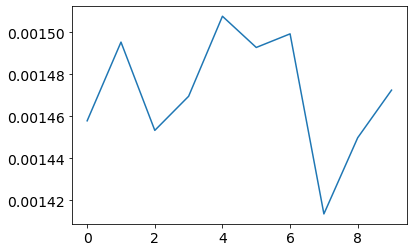

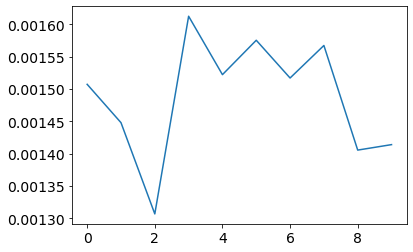

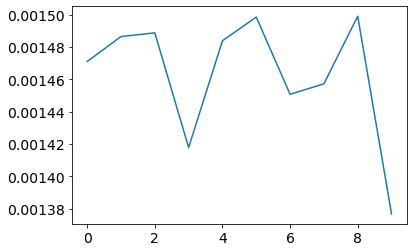

Errors Found: 2
Repeat Number: 9 Number of Errors: 2
Shout_meas_02-28-2024_08-31-46
The old lag 99746
The old lag 99746


<Figure size 432x288 with 0 Axes>

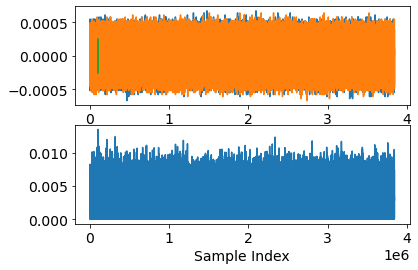

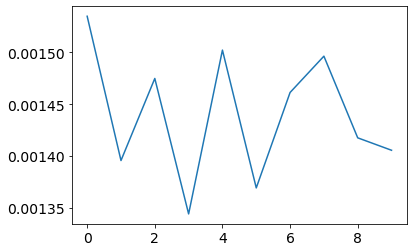

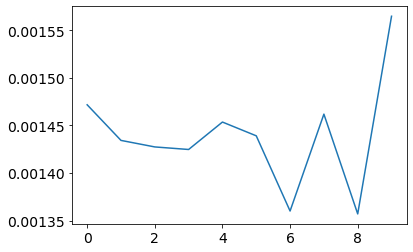

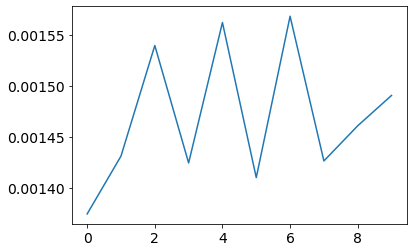

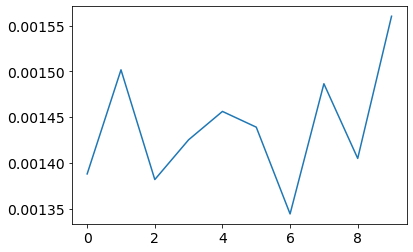

Repeat Number: 0 Number of Errors: 0
The old lag 1819658
The new lag 1819651


<Figure size 432x288 with 0 Axes>

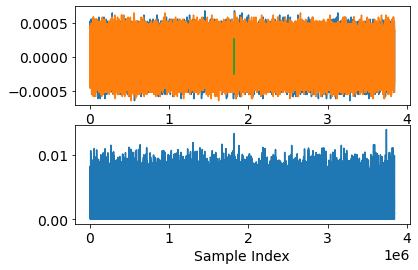

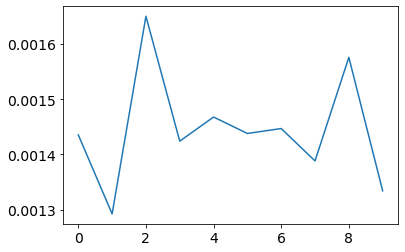

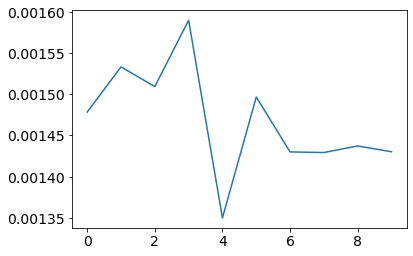

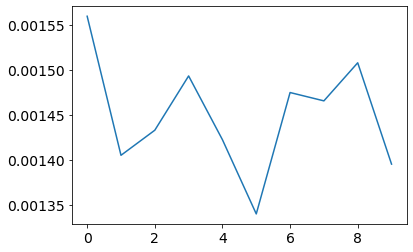

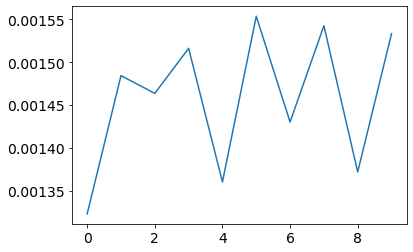

Repeat Number: 1 Number of Errors: 0
The old lag 220584
The new lag 1618179


<Figure size 432x288 with 0 Axes>

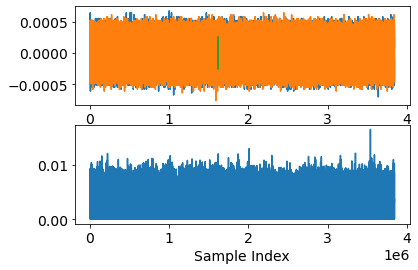

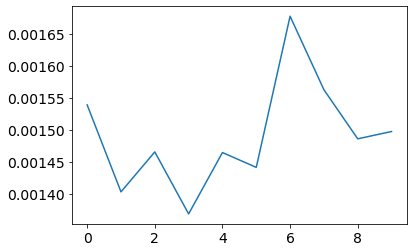

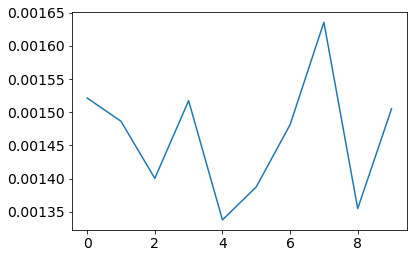

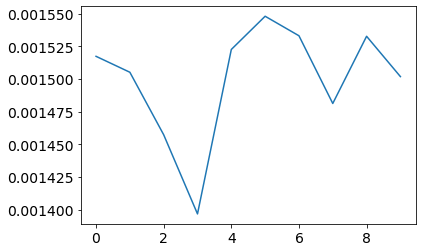

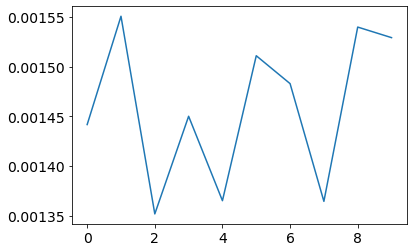

Repeat Number: 2 Number of Errors: 0
The old lag 1203280
The old lag 1203280


<Figure size 432x288 with 0 Axes>

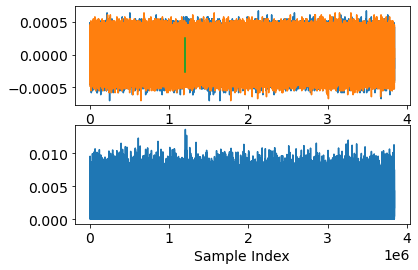

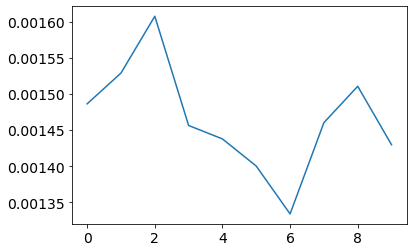

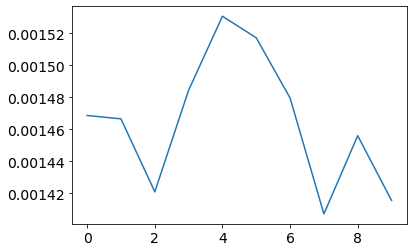

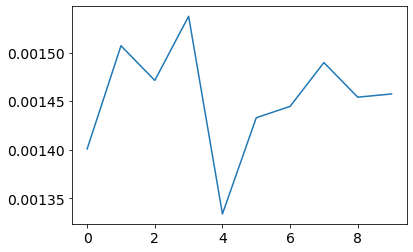

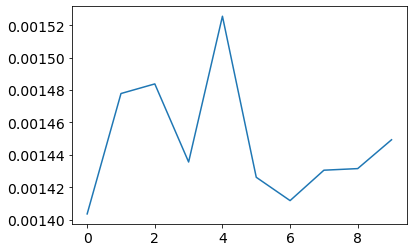

Errors Found: 2
Repeat Number: 3 Number of Errors: 2
The old lag 1058002
The old lag 1058002


<Figure size 432x288 with 0 Axes>

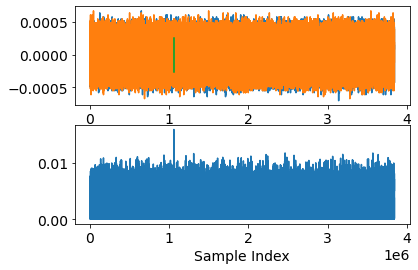

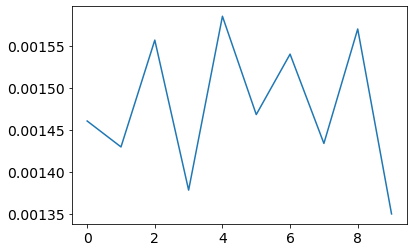

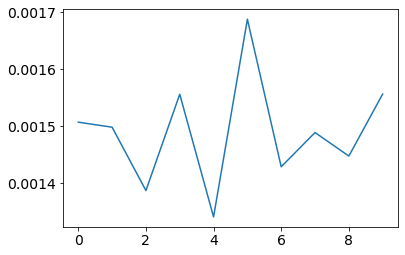

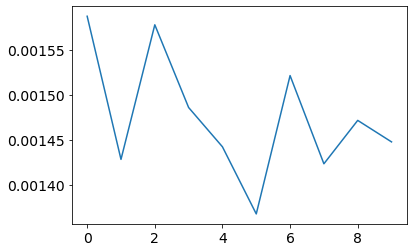

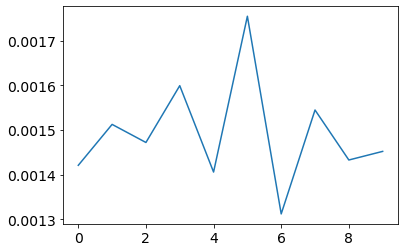

Repeat Number: 4 Number of Errors: 0
The old lag 954609
The old lag 954609


<Figure size 432x288 with 0 Axes>

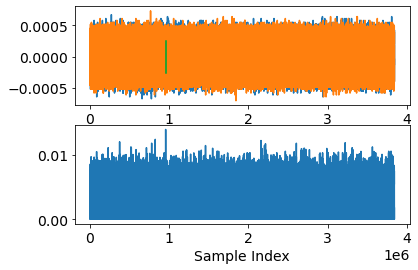

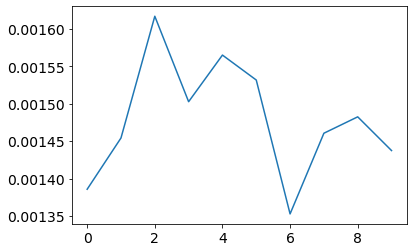

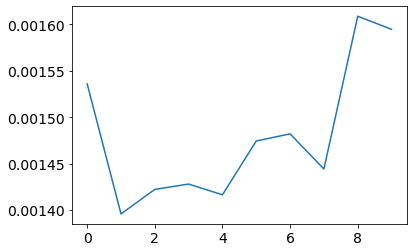

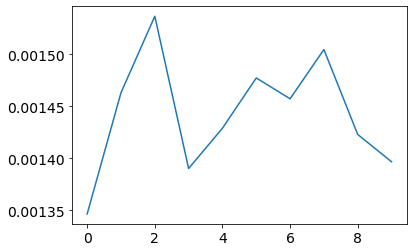

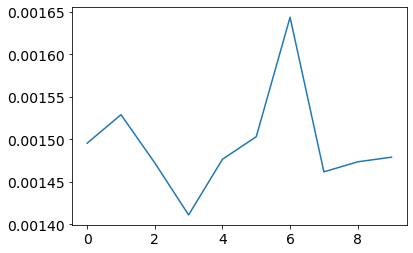

Errors Found: 2
Repeat Number: 5 Number of Errors: 2
The old lag 576426
The new lag 1717750


<Figure size 432x288 with 0 Axes>

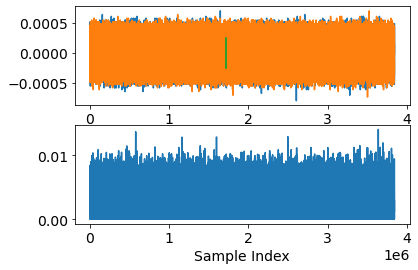

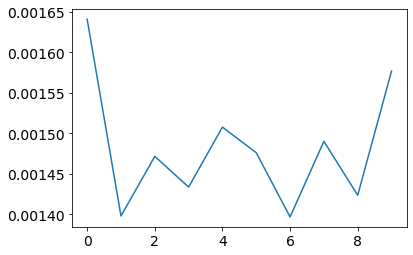

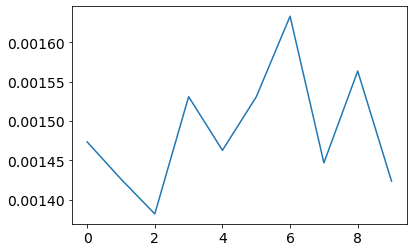

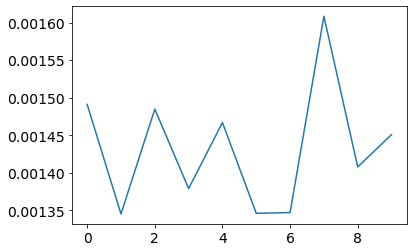

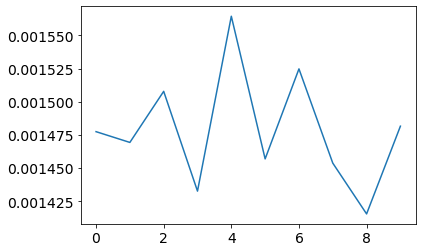

Errors Found: 3
Repeat Number: 6 Number of Errors: 3
The old lag 525196
The new lag 220581


<Figure size 432x288 with 0 Axes>

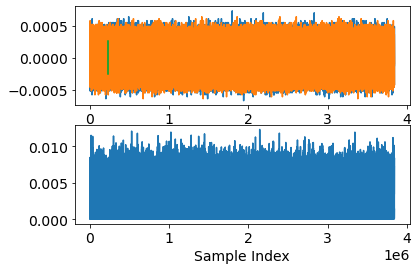

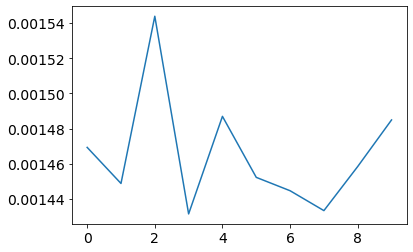

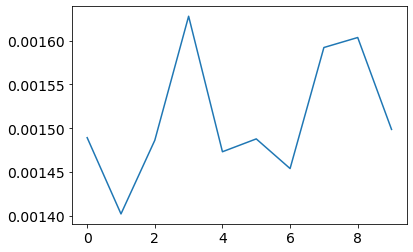

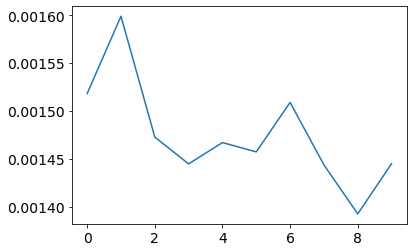

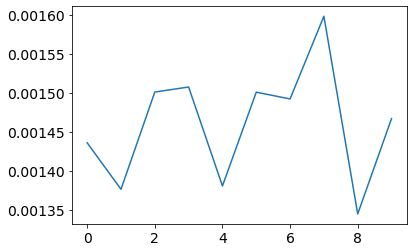

Errors Found: 1
Repeat Number: 7 Number of Errors: 1
The old lag 620108
The new lag 94907


<Figure size 432x288 with 0 Axes>

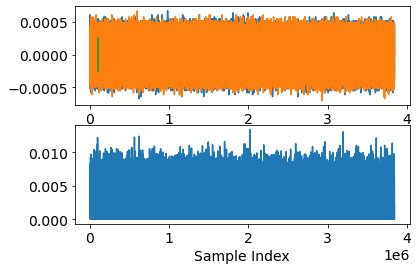

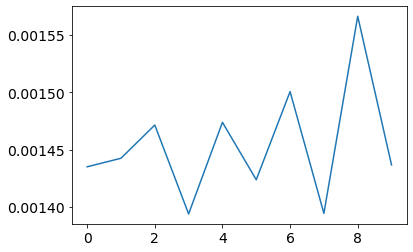

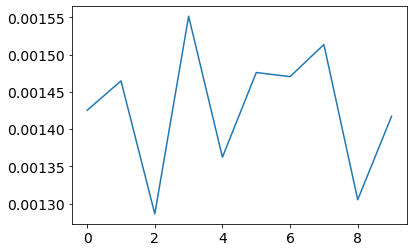

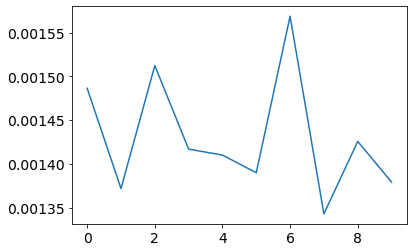

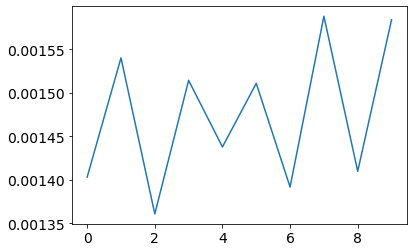

Repeat Number: 8 Number of Errors: 0
The old lag 1736131
The old lag 1736131


<Figure size 432x288 with 0 Axes>

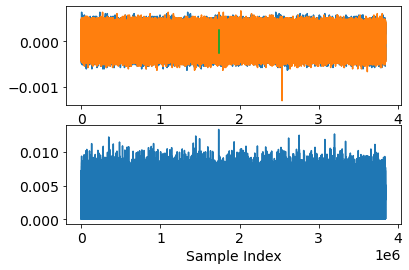

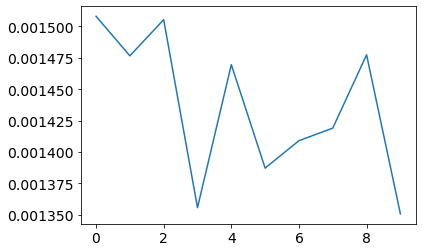

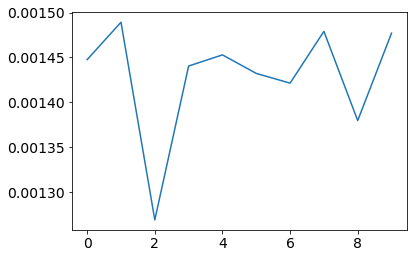

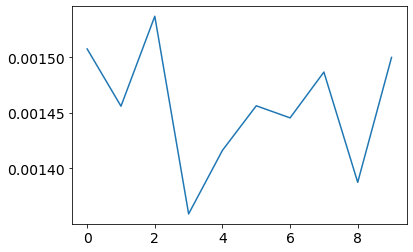

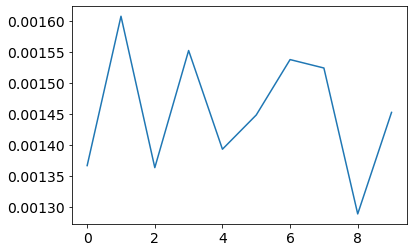

Errors Found: 1
Repeat Number: 9 Number of Errors: 1
Shout_meas_02-28-2024_09-10-54
The old lag 1571461
The old lag 1571461


<Figure size 432x288 with 0 Axes>

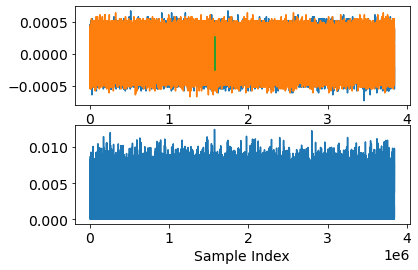

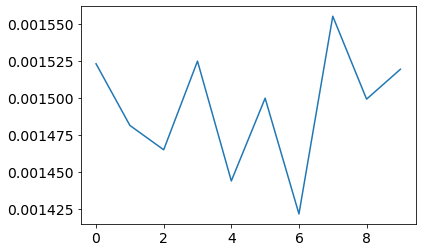

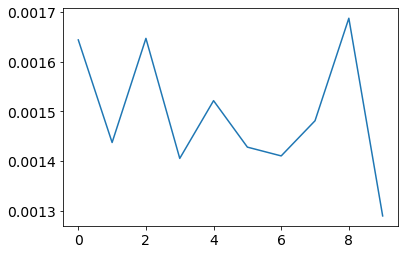

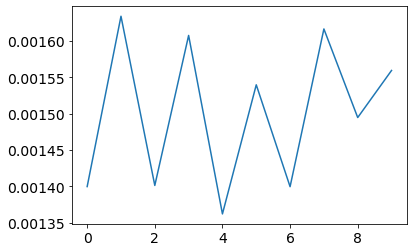

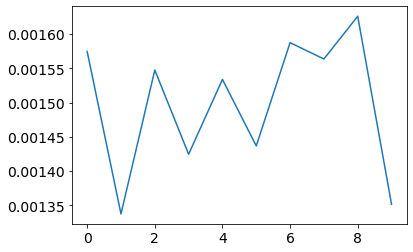

Errors Found: 4
Repeat Number: 0 Number of Errors: 4
The old lag 1628629
The old lag 1628629


<Figure size 432x288 with 0 Axes>

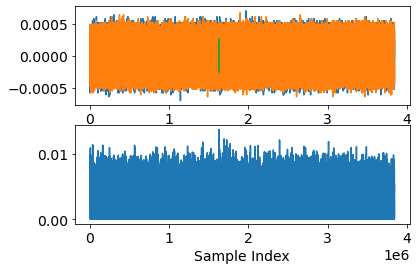

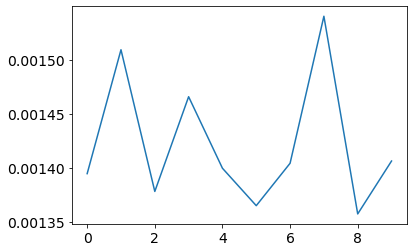

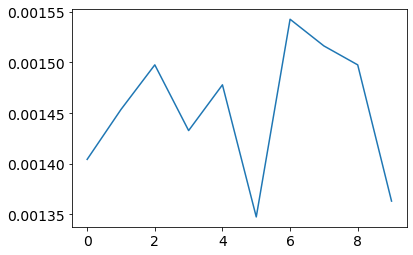

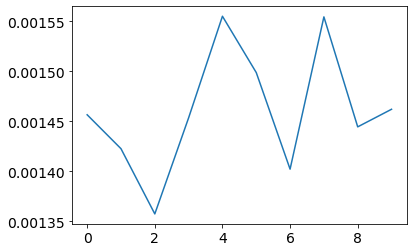

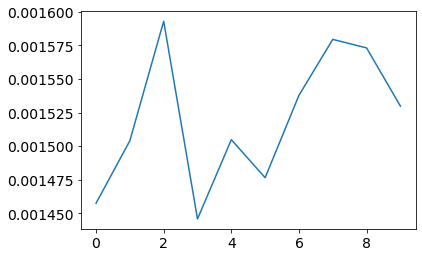

Errors Found: 4
Repeat Number: 1 Number of Errors: 4
The old lag 1156095
The old lag 1156095


<Figure size 432x288 with 0 Axes>

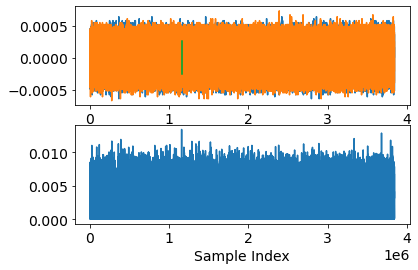

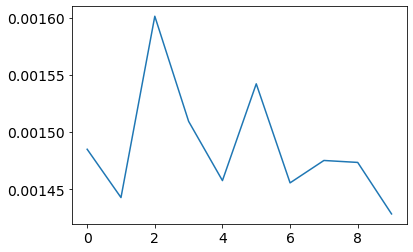

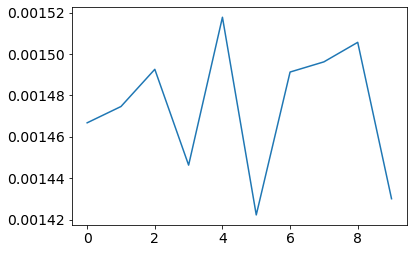

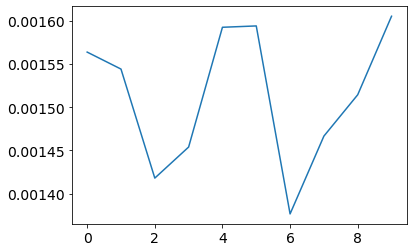

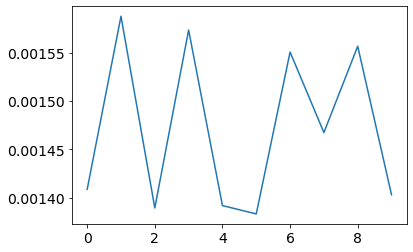

Errors Found: 4
Repeat Number: 2 Number of Errors: 4
The old lag 905405
The new lag 1132248


<Figure size 432x288 with 0 Axes>

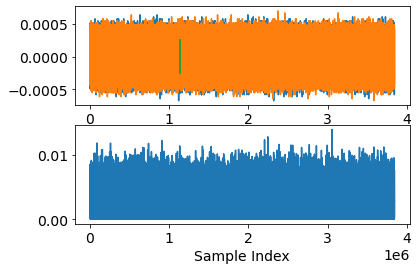

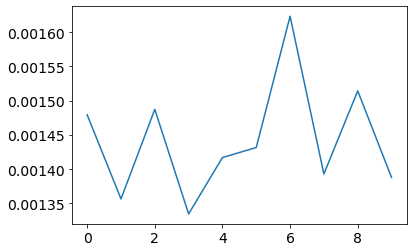

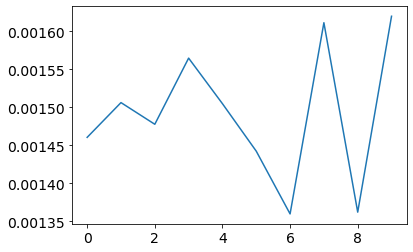

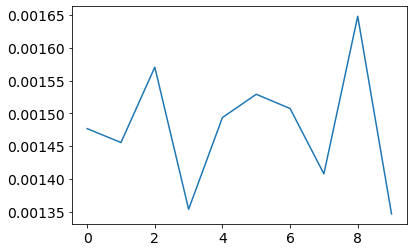

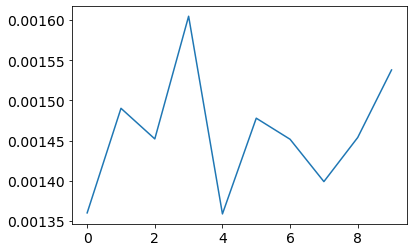

Repeat Number: 3 Number of Errors: 0
The old lag 490589
The new lag 930807


<Figure size 432x288 with 0 Axes>

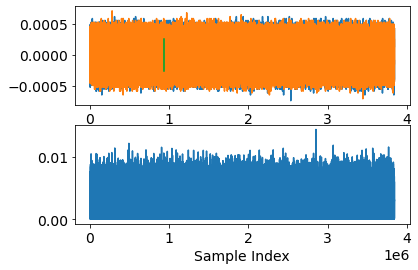

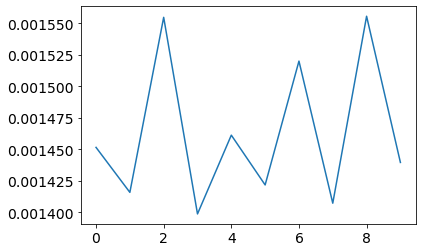

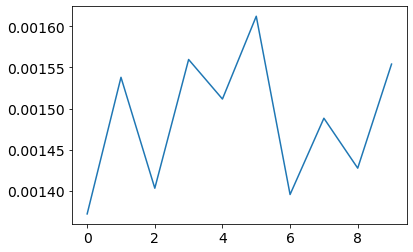

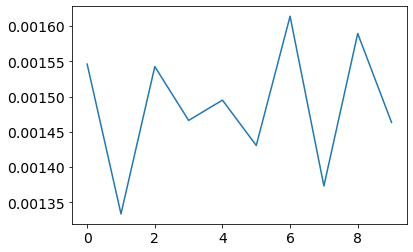

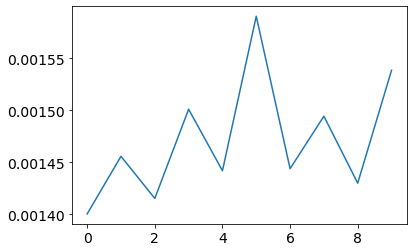

Repeat Number: 4 Number of Errors: 0
The old lag 995393
The old lag 995393


<Figure size 432x288 with 0 Axes>

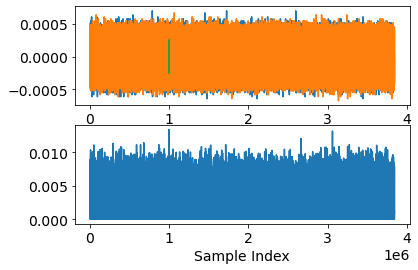

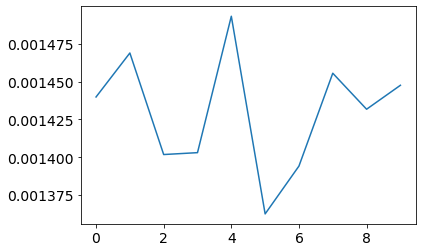

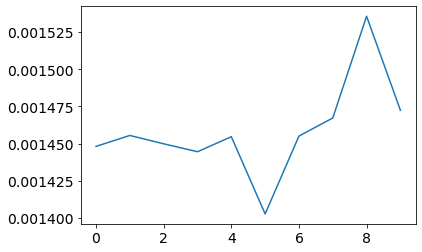

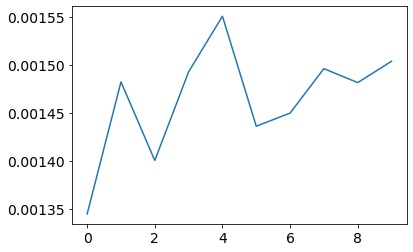

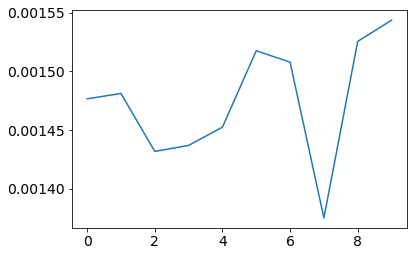

Errors Found: 3
Repeat Number: 5 Number of Errors: 3
The old lag 1337436
The old lag 1337436


<Figure size 432x288 with 0 Axes>

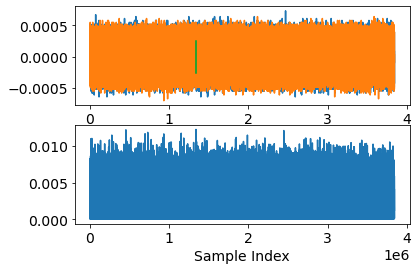

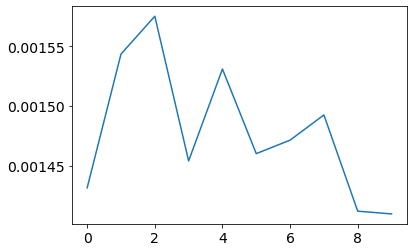

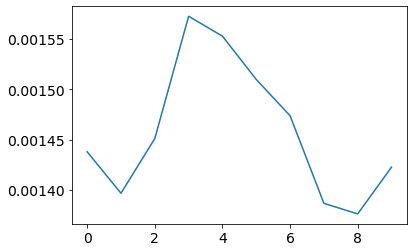

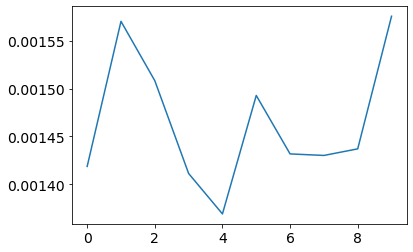

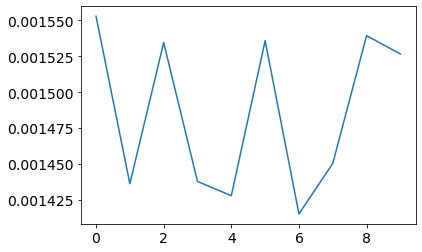

Errors Found: 2
Repeat Number: 6 Number of Errors: 2
The old lag 247733
The new lag 666224


<Figure size 432x288 with 0 Axes>

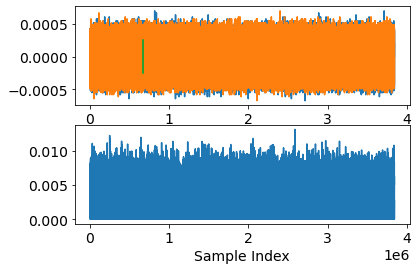

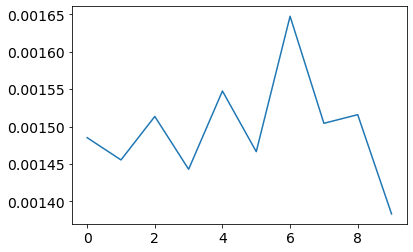

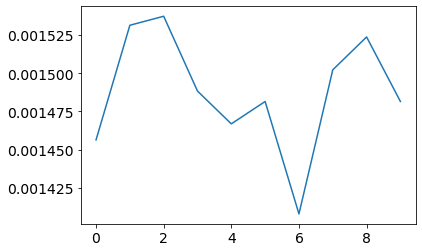

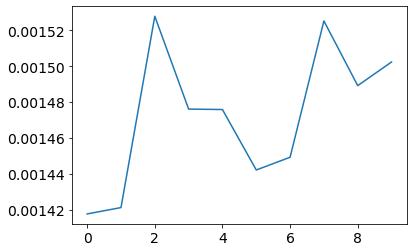

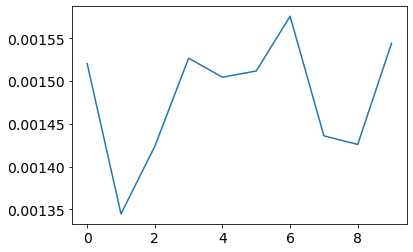

Errors Found: 1
Repeat Number: 7 Number of Errors: 1
The old lag 46366
The old lag 46366


<Figure size 432x288 with 0 Axes>

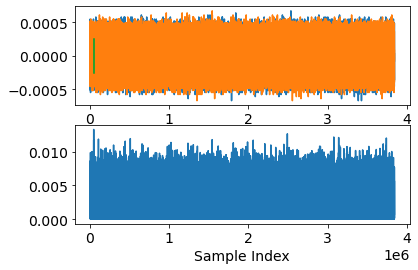

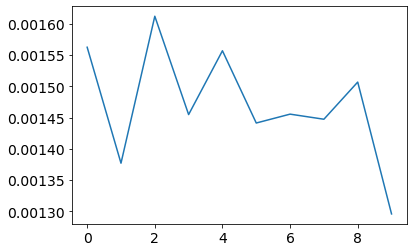

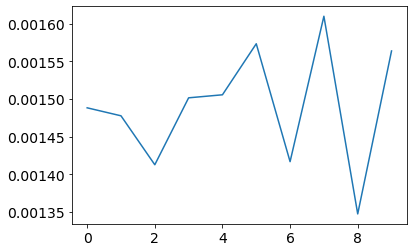

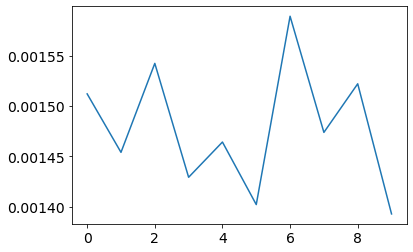

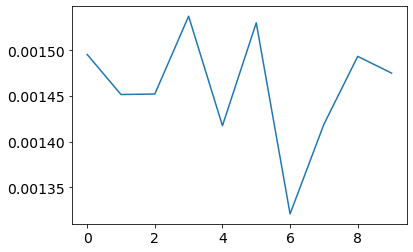

Repeat Number: 8 Number of Errors: 0
The old lag 1640801
The new lag 1766101


<Figure size 432x288 with 0 Axes>

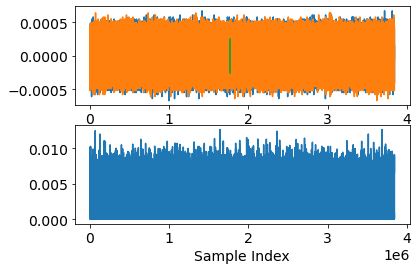

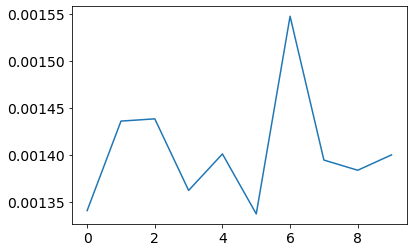

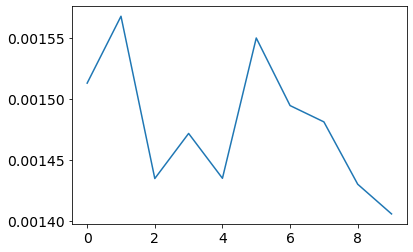

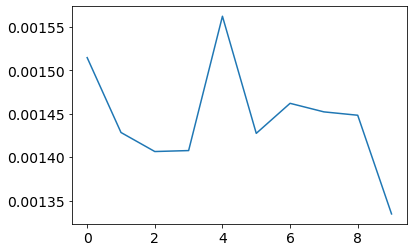

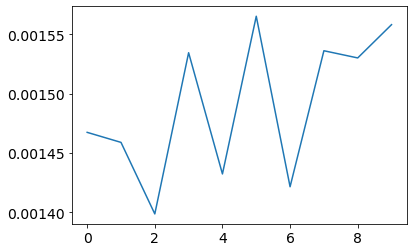

Repeat Number: 9 Number of Errors: 0
Shout_meas_02-28-2024_08-46-05
The old lag 260239
The old lag 260239


<Figure size 432x288 with 0 Axes>

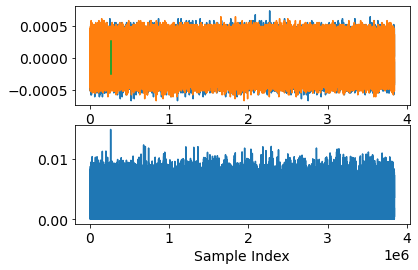

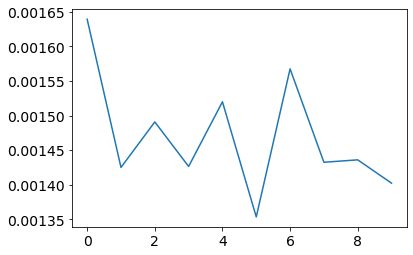

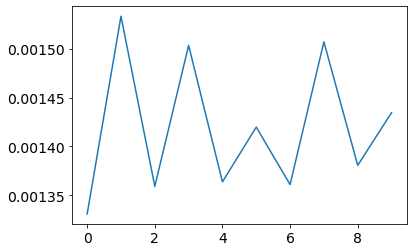

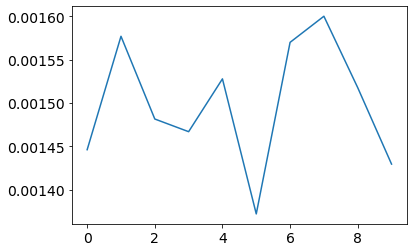

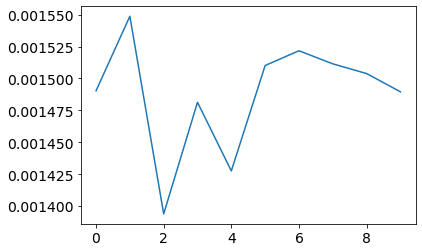

Repeat Number: 0 Number of Errors: 0
The old lag 1665036
The new lag 137383


<Figure size 432x288 with 0 Axes>

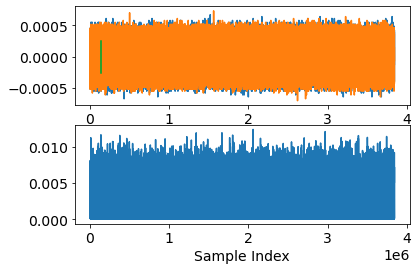

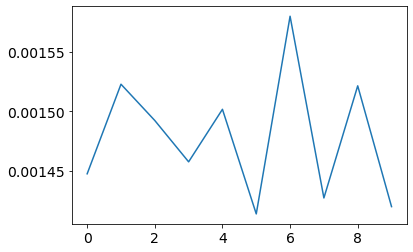

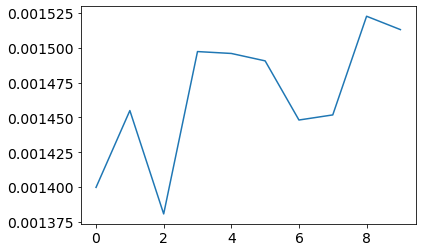

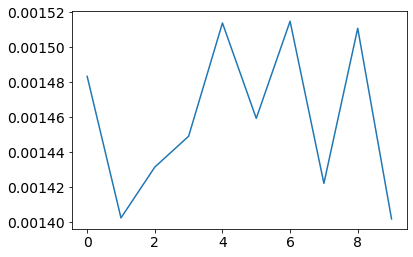

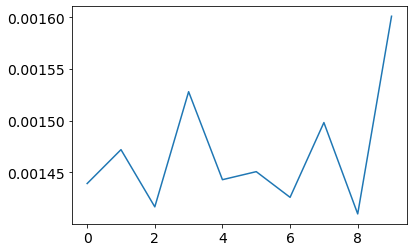

Repeat Number: 1 Number of Errors: 0
The old lag 1857247
The old lag 1857247


<Figure size 432x288 with 0 Axes>

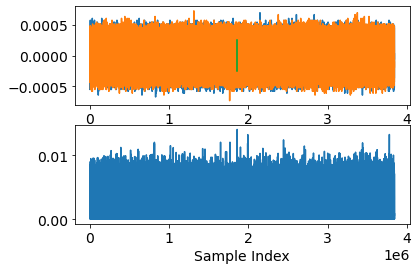

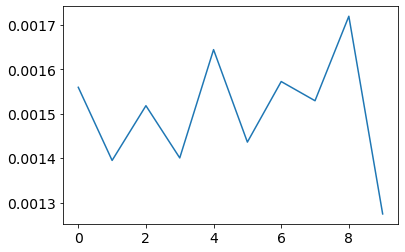

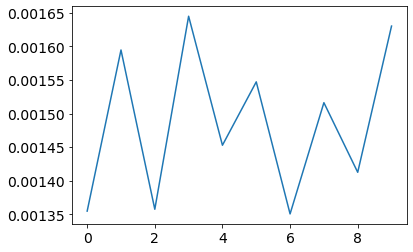

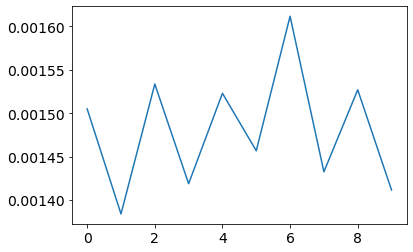

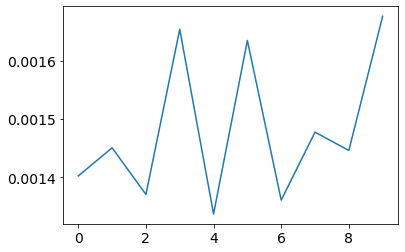

Repeat Number: 2 Number of Errors: 0
The old lag 1577112
The new lag 1577177


<Figure size 432x288 with 0 Axes>

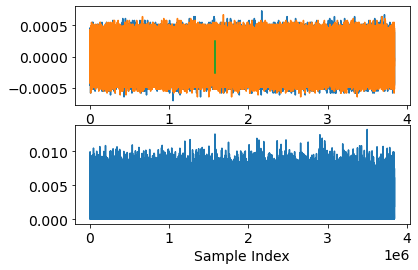

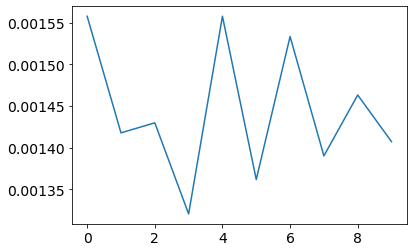

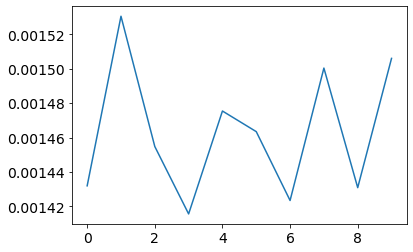

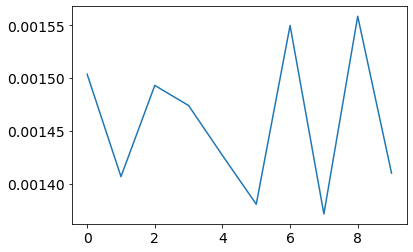

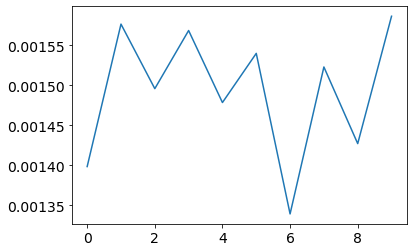

Repeat Number: 3 Number of Errors: 0
The old lag 89933
The old lag 89933


<Figure size 432x288 with 0 Axes>

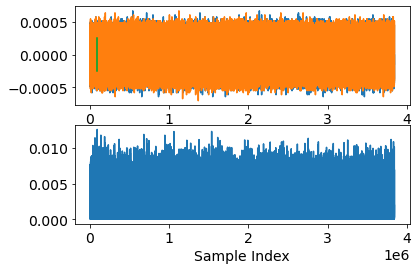

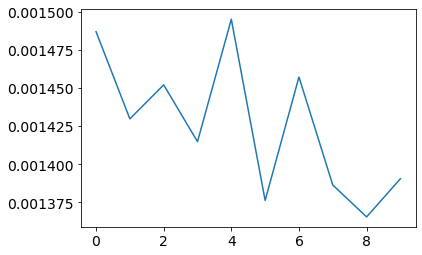

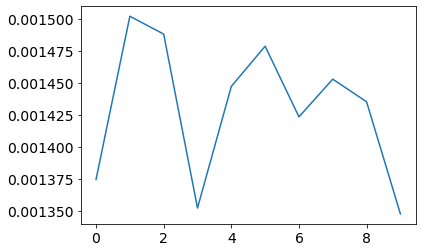

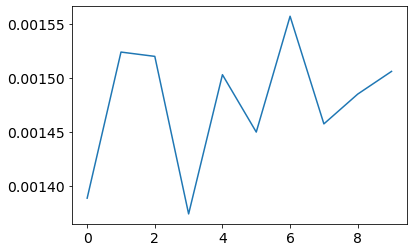

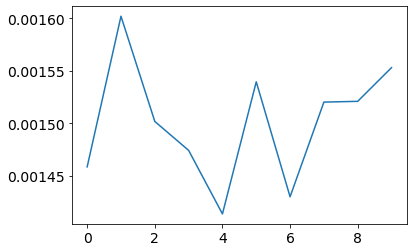

Repeat Number: 4 Number of Errors: 0
The old lag 282297
The new lag 602542


<Figure size 432x288 with 0 Axes>

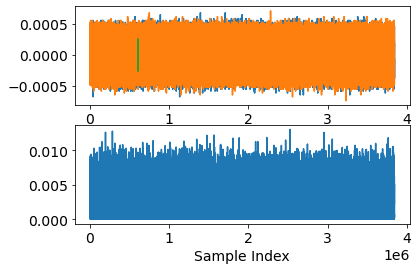

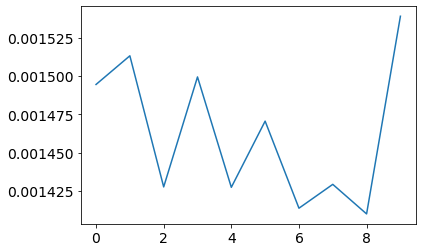

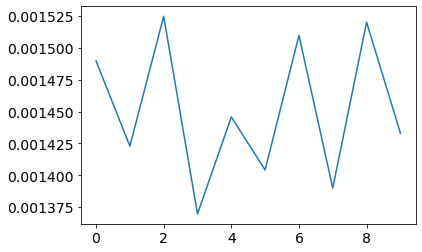

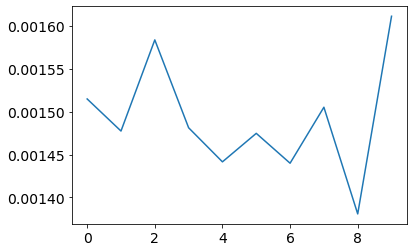

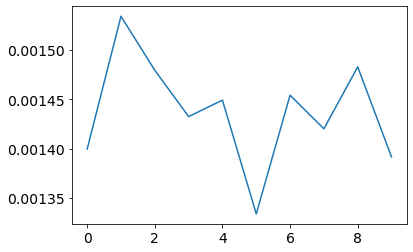

Errors Found: 4
Repeat Number: 5 Number of Errors: 4
The old lag 972791
The old lag 972791


<Figure size 432x288 with 0 Axes>

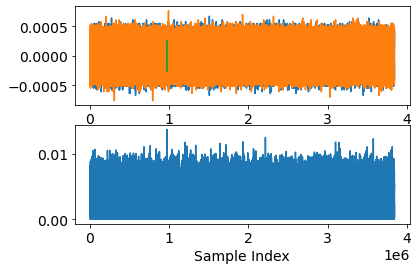

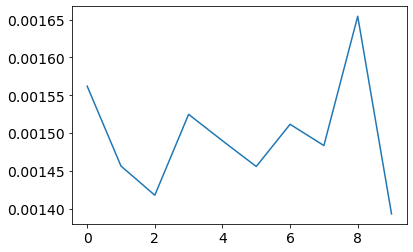

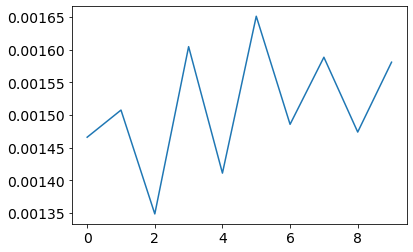

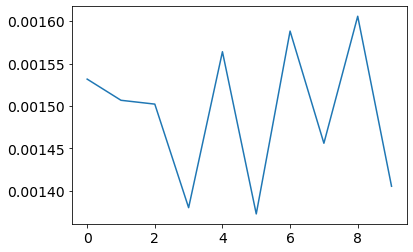

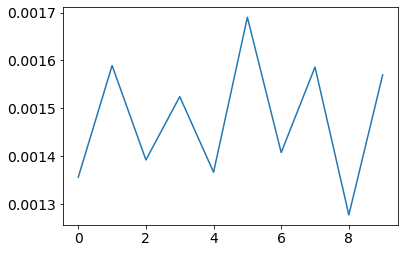

Repeat Number: 6 Number of Errors: 0
The old lag 1645059
The old lag 1645059


<Figure size 432x288 with 0 Axes>

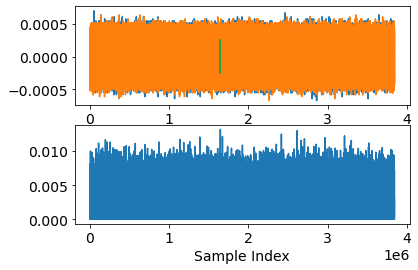

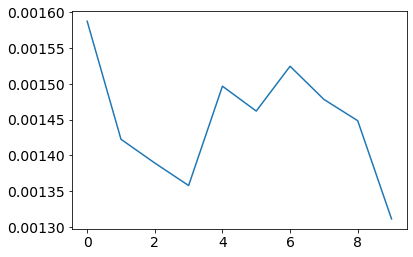

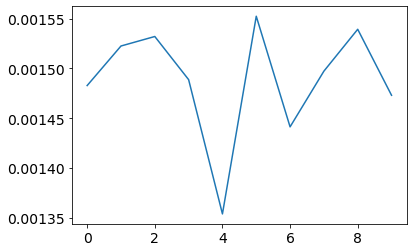

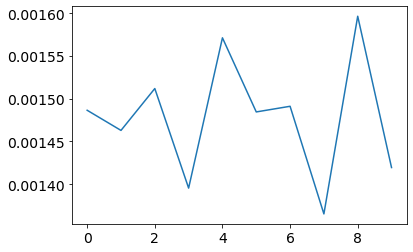

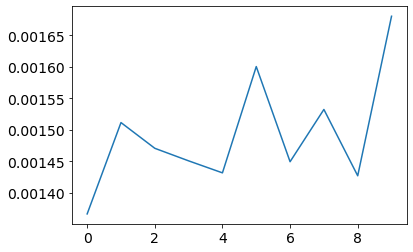

Repeat Number: 7 Number of Errors: 0
The old lag 98281
The new lag 106193


<Figure size 432x288 with 0 Axes>

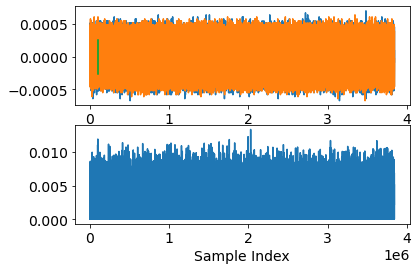

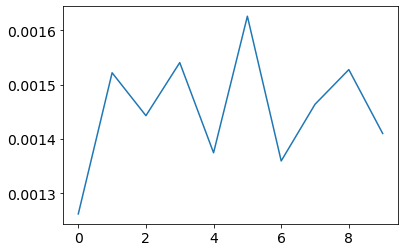

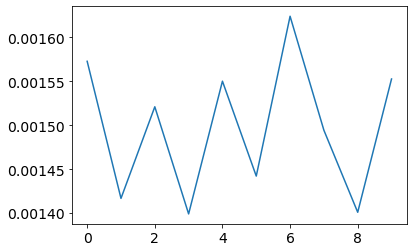

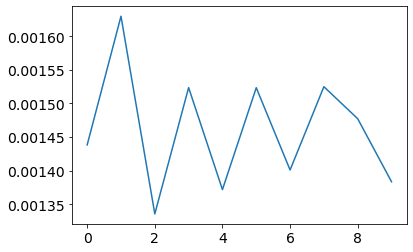

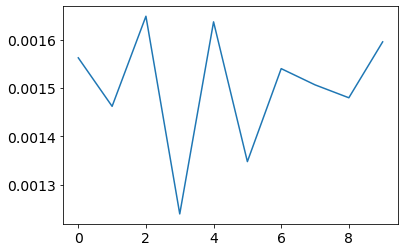

Errors Found: 4
Repeat Number: 8 Number of Errors: 4
The old lag 818208
The new lag 289767


<Figure size 432x288 with 0 Axes>

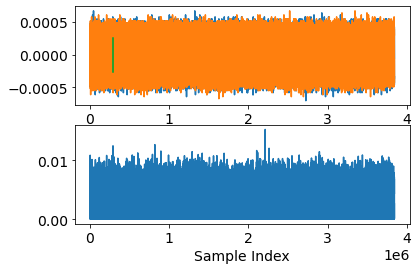

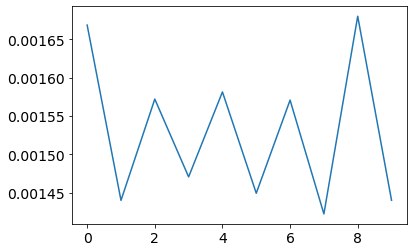

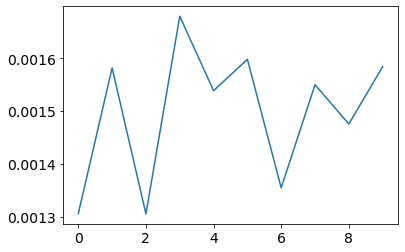

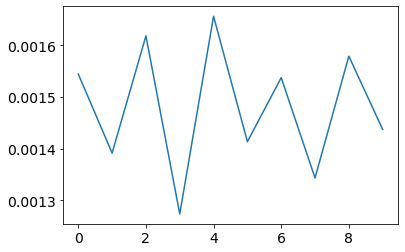

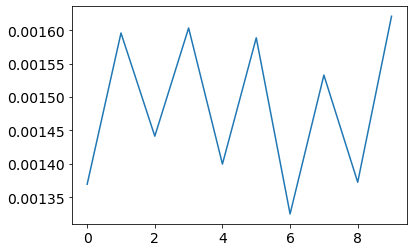

Repeat Number: 9 Number of Errors: 0
Shout_meas_02-28-2024_08-56-35
The old lag 1378687
The old lag 1378687


<Figure size 432x288 with 0 Axes>

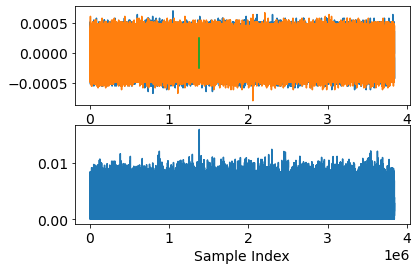

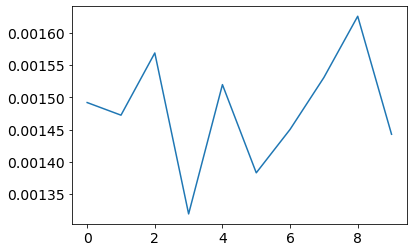

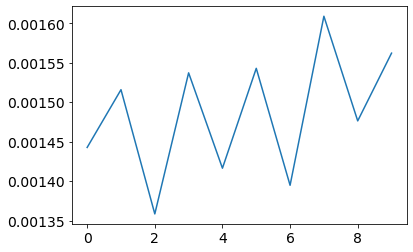

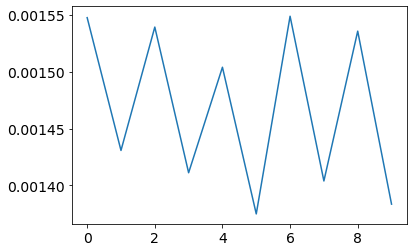

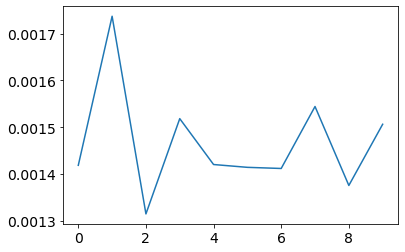

Repeat Number: 0 Number of Errors: 0
The old lag 152631
The new lag 242694


<Figure size 432x288 with 0 Axes>

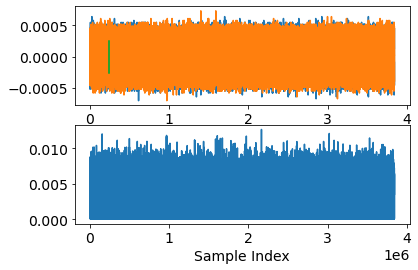

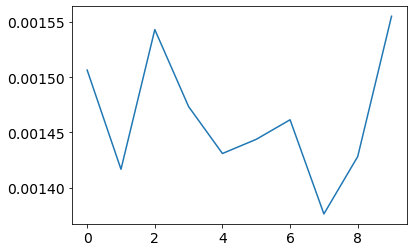

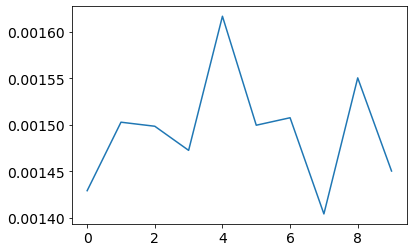

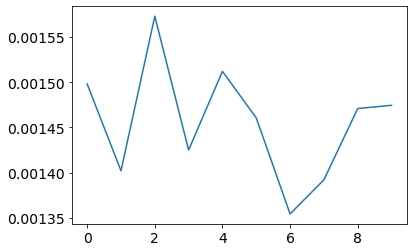

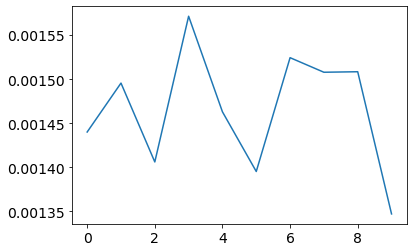

Errors Found: 2
Repeat Number: 1 Number of Errors: 2
The old lag 623194
The old lag 623194


<Figure size 432x288 with 0 Axes>

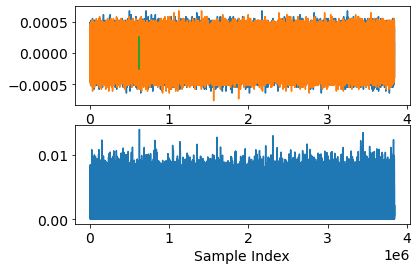

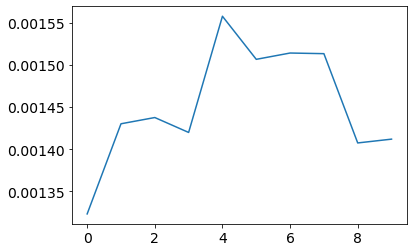

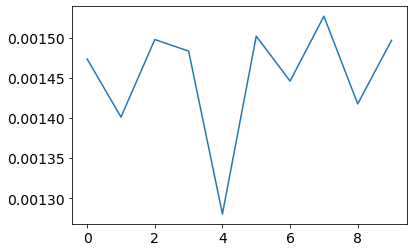

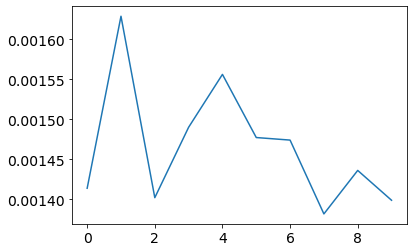

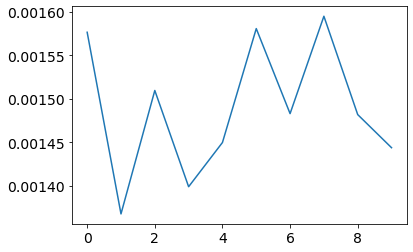

Errors Found: 1
Repeat Number: 2 Number of Errors: 1
The old lag 1061576
The new lag 1828722


<Figure size 432x288 with 0 Axes>

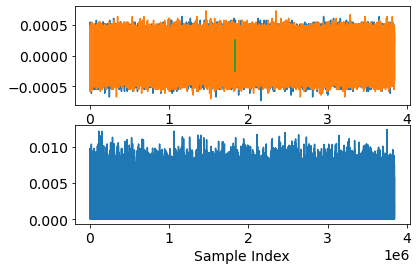

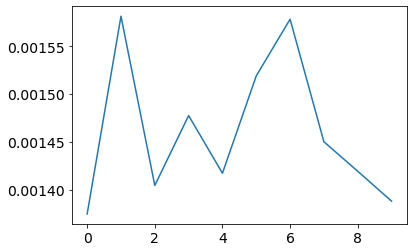

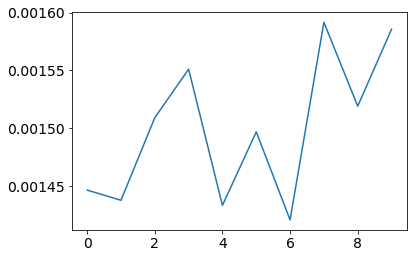

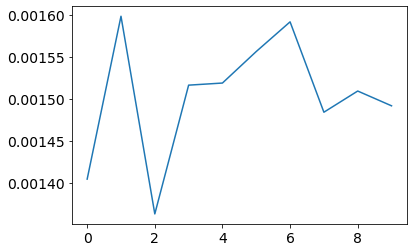

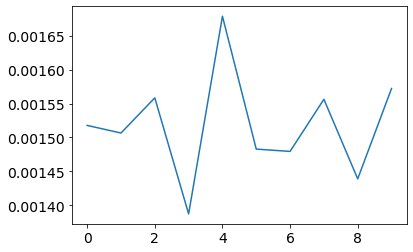

Errors Found: 1
Repeat Number: 3 Number of Errors: 1
The old lag 495247
The old lag 495247


<Figure size 432x288 with 0 Axes>

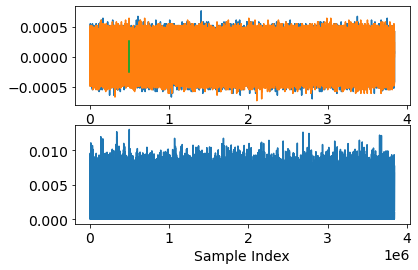

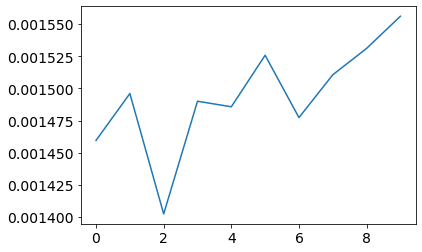

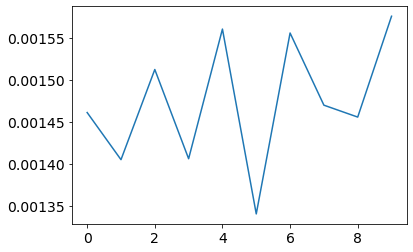

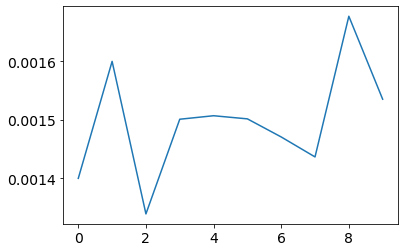

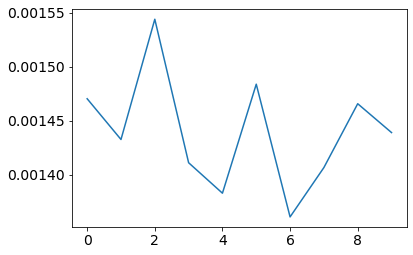

Errors Found: 3
Repeat Number: 4 Number of Errors: 3
The old lag 56735
The old lag 56735


<Figure size 432x288 with 0 Axes>

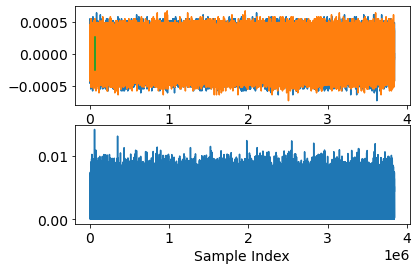

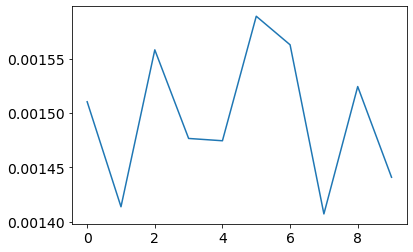

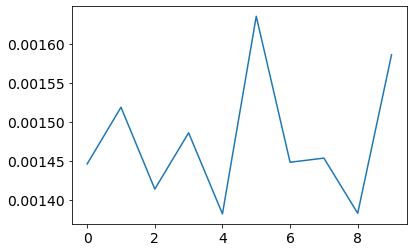

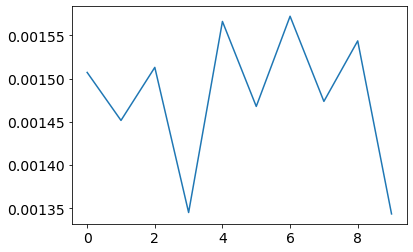

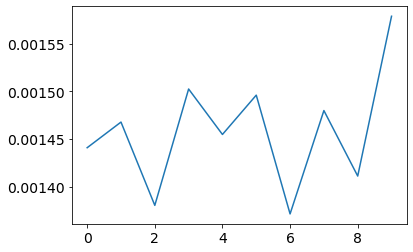

Repeat Number: 5 Number of Errors: 0
The old lag 1870253
The new lag 756868


<Figure size 432x288 with 0 Axes>

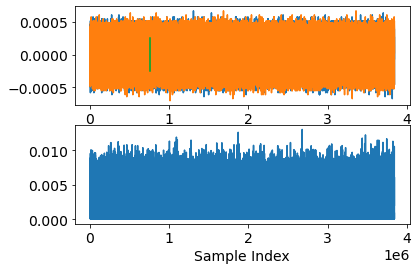

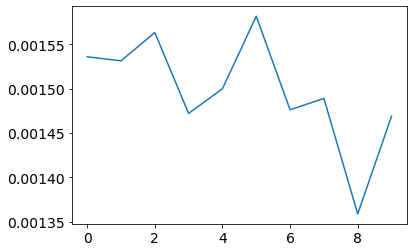

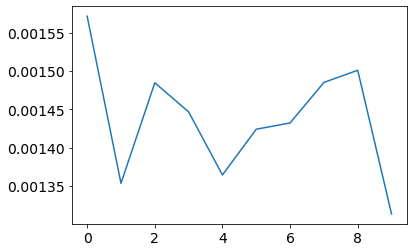

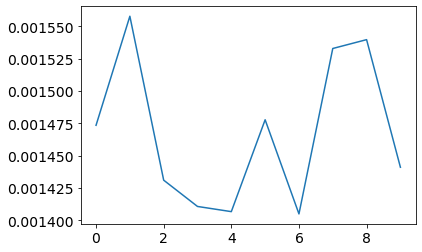

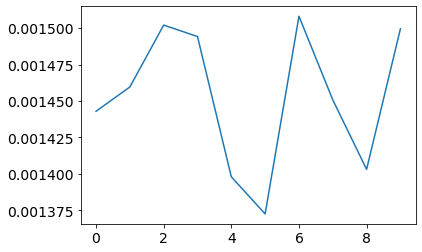

Errors Found: 3
Repeat Number: 6 Number of Errors: 3
The old lag 486143
The old lag 486143


<Figure size 432x288 with 0 Axes>

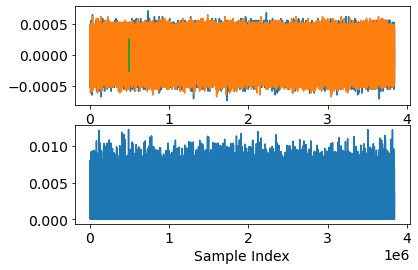

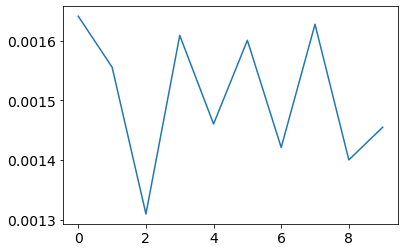

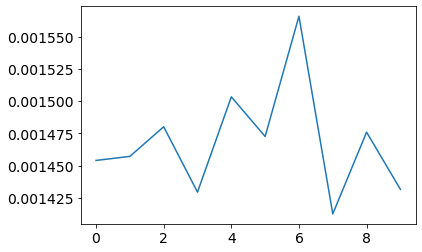

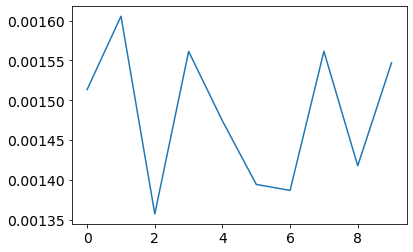

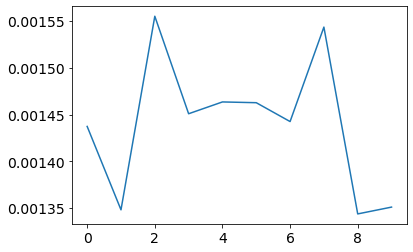

Errors Found: 3
Repeat Number: 7 Number of Errors: 3
The old lag 821928
The new lag 1295142


<Figure size 432x288 with 0 Axes>

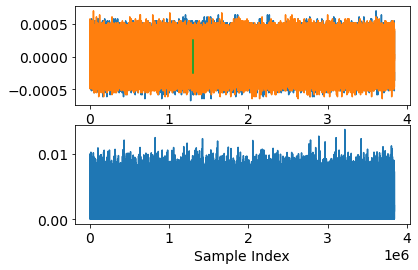

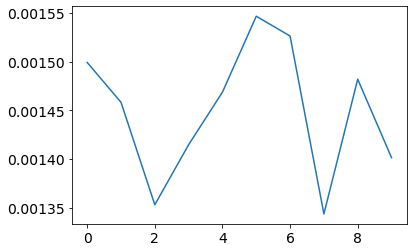

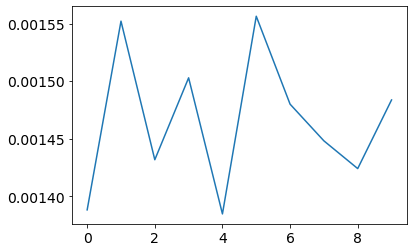

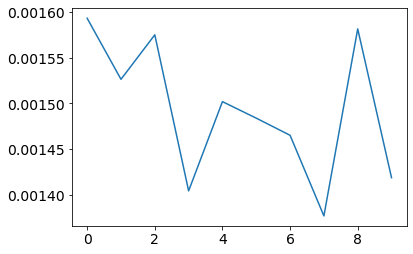

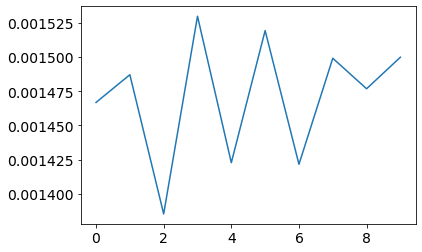

Repeat Number: 8 Number of Errors: 0
The old lag 1433567
The old lag 1433567


<Figure size 432x288 with 0 Axes>

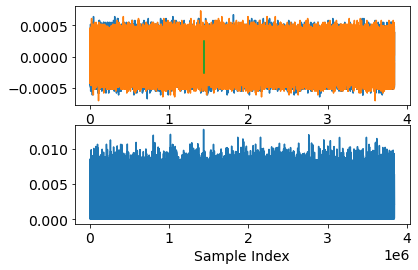

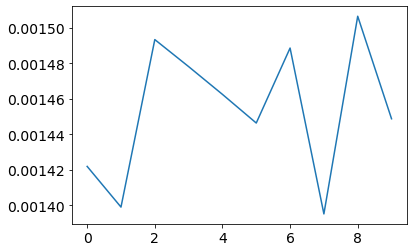

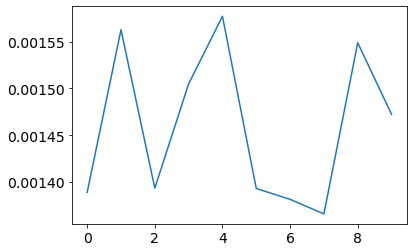

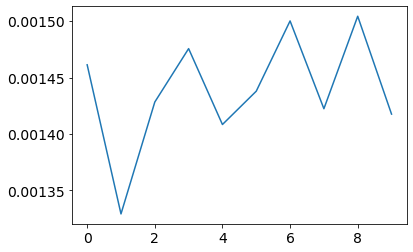

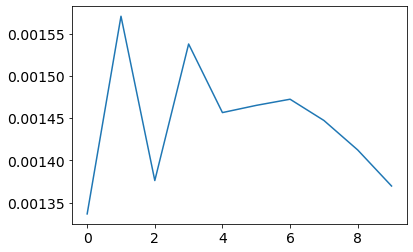

Errors Found: 1
Repeat Number: 9 Number of Errors: 1
total number of pseudonym bit errors: 117


(0.2925, -20.652207527142366)

In [216]:
Prob_Pseudonym_Error("-20dB_one_channel")


In [217]:
#pb_BER, Eb_No, Noise_interference = Prob_Pseudonym_Error("10dB_gain_interference")

In [218]:
# plt.plot(x,Noise[:29], label = "Just noise") 
# plt.plot(x,Noise_interference[:29], label = "Noise + Interference") 
# plt.legend() 
# plt.show()